## Import Packages

In [1]:
import pandas as pd
import numpy as np

from urllib.request import urlopen
from bs4 import BeautifulSoup
import requests

import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

from functools import partial

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge 
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.linear_model import ElasticNet 
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoCV
from sklearn import feature_selection as f_select
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Lasso
from sklearn.linear_model import lars_path
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

from math import sqrt
import statsmodels.api as sm
import statsmodels.formula.api as smf 

import patsy
%matplotlib inline

## Import data from Basketball Reference (2009-2021)

In [2]:
#Create a function to aggregate data from https://www.basketball-reference.com/
#Interested in three pages: regular stats in Per Game, Advanced stats, and offensive/defensive efficiency raints
#List of years to look into back to 2009 when NBA team really started to embrace analytics in depth for organizational decisions

years= [2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021] 

def agg_data(x):
    df = pd.DataFrame([])
    for i in x:
        link = "https://www.basketball-reference.com/leagues/NBA_{}_per_game.html".format(i)
        html = urlopen(link)
        soup = BeautifulSoup(html,'lxml')

        link_adv = "https://www.basketball-reference.com/leagues/NBA_{}_advanced.html".format(i)
        html_adv = urlopen(link_adv)
        soup_adv = BeautifulSoup(html_adv,'lxml')


        link_poss = "https://www.basketball-reference.com/leagues/NBA_{}_per_poss.html".format(i)
        html_poss = urlopen(link_poss)
        soup_poss = BeautifulSoup(html_poss,'lxml')
    
        head = [stat.text for stat in soup.find_all('tr',limit =1) for i in soup.find_all('th')]
        headers = head[0].split("\n")
        headers = headers[2:-1]


        head_adv = [stat.text for stat in soup_adv.find_all('tr',limit =1) for i in soup.find_all('th')]
        headers_adv = head_adv[0].split("\n")
        headers_adv = headers_adv[2:-1]


        head_poss = [stat.text for stat in soup_poss.find_all('tr',limit =1) for i in soup_poss.find_all('th')]
        headers_poss = head_poss[0].split("\n")
        headers_poss = headers_poss[2:-1]
        
        reg_stats = [i for i in soup.find_all('tr',class_="full_table")]

        adv_stats = [i for i in soup_adv.find_all('tr',class_="full_table")]

        poss_stats  =[i for i in soup_poss.find_all('tr',class_="full_table")]
        
        def data_in(rows):
            pros={}
            for row in rows[:600]:
                items = row.find_all('td')
                links = items[0].text
                title = links
                pros[title] = [title] + [i.text for i in items[1:]]
            return pros
        
        play = data_in(reg_stats)
        play_adv = data_in(adv_stats)
        play_poss = data_in(poss_stats)
        
        players = pd.DataFrame(play).T  
        players.columns = headers
        players.rename(columns={'MP':'MPG'}, inplace=True)
        players.reset_index(drop=True,inplace=True)


        players_adv = pd.DataFrame(play_adv).T  
        players_adv.columns = headers_adv
        players_adv.drop(columns = ['Pos','Age','G','\xa0','\xa0'],inplace= True)
        players_adv.rename(columns={'MP':'Tot_Min','TS%':'TSP'}, inplace=True)
        players_adv.reset_index(drop=True,inplace=True)


        players_poss = pd.DataFrame(play_poss).T  
        players_poss.columns = headers_poss
        players_poss.reset_index(drop=True,inplace=True)
        players_poss = players_poss[["Player","ORtg","DRtg"]]

        #merge various dataframes, update columns names so they place nice with modeling packages
        players = pd.merge(left=players, right=players_adv, how='inner', left_on=['Player','Tm'], right_on=['Player','Tm'])
        players = pd.merge(left=players, right=players_poss, how='inner', left_on=['Player'], right_on=['Player'])
        players = players.rename(columns={'FG%': 'FGPerc', '3P%': 'ThreePerc','3PA':"ThreePA",'3P':'ThreePoint','2P':'TwoPoint','2PA':'TwoPA','2P%':'TwoPerc','eFG%':'eFGPerc',"FT%":"FTPerc","TS":"TSPerc",'ORB%':"ORBP", 'DRB%':'DRBP', 'TRB%':'TRBP', 'AST%':"ASTP", 'STL%':"STLP",'BLK%':"BLKP", 'TOV%':"TOVP", 'USG%':'USGP','WS/48':'WS48'})
        players.apply(partial(pd.to_numeric, errors='ignore'))
        players['Year'] = i
        df = df.append(players)
        
    df = df.apply(partial(pd.to_numeric, errors='ignore'))
    return df.reset_index(drop=True)

In [3]:
ballers = agg_data(years)

## Investigate / Clean Data / Exploratory Data Analysis

In [4]:
ballers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6341 entries, 0 to 6340
Data columns (total 53 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Player      6341 non-null   object 
 1   Pos         6341 non-null   object 
 2   Age         6341 non-null   int64  
 3   Tm          6341 non-null   object 
 4   G           6341 non-null   int64  
 5   GS          6341 non-null   int64  
 6   MPG         6341 non-null   float64
 7   FG          6341 non-null   float64
 8   FGA         6341 non-null   float64
 9   FGPerc      6318 non-null   float64
 10  ThreePoint  6341 non-null   float64
 11  ThreePA     6341 non-null   float64
 12  ThreePerc   5645 non-null   float64
 13  TwoPoint    6341 non-null   float64
 14  TwoPA       6341 non-null   float64
 15  TwoPerc     6286 non-null   float64
 16  eFGPerc     6318 non-null   float64
 17  FT          6341 non-null   float64
 18  FTA         6341 non-null   float64
 19  FTPerc      6091 non-null  

It appears we are missing quite a few rows that seem to be primarily around percentages (i.e. ThreePerc) categories. We will investigate this but let's first look at the high level statistics of our categories.

In our first bucket we do notice that a couple players have played 83 games in an 82 game schedule.  This is because they players were traded to teams that had played less games and therfore actually did play more than 82 games.

In [5]:
#Chunk out the data and confirm no negative values or anything completely off in the data
ballers.iloc[:,:15].describe()

,Age,G,GS,MPG,FG,FGA,FGPerc,ThreePoint,ThreePA,ThreePerc,TwoPoint,TwoPA
count,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6318.000000,6341.000000,6341.000000,5645.000000,6341.000000,6341.000000
mean,26.302161,49.988488,23.922094,20.080823,3.111434,6.902302,0.441420,0.708595,2.020233,0.294839,2.403548,4.882369
std,4.221080,24.738392,27.742659,9.513417,2.158717,4.538905,0.098525,0.748622,1.947792,0.148741,1.865931,3.620245
min,19.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,23.000000,30.000000,1.000000,12.400000,1.400000,3.400000,0.400000,0.000000,0.200000,0.250000,1.000000,2.100000
50%,26.000000,55.000000,10.000000,19.700000,2.600000,5.900000,0.440000,0.500000,1.600000,0.333000,1.900000,3.900000
75%,29.000000,72.000000,46.000000,28.000000,4.400000,9.600000,0.487000,1.100000,3.300000,0.376000,3.400000,6.700000
max,43.000000,83.000000,82.000000,42.000000,10.900000,24.500000,1.000000,5.100000,13.200000,1.000000,10.100000,20.400000


In [6]:
ballers.iloc[:,16:30].describe()

,eFGPerc,FT,FTA,FTPerc,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Tot_Min
count,6318.000000,6341.000000,6341.000000,6091.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000,6341.000000
mean,0.489913,1.417994,1.876171,0.731957,0.889339,2.680208,3.567434,1.831903,0.630263,0.406198,1.138369,1.745561,8.345103,1156.562530
std,0.100868,1.360703,1.688013,0.146923,0.799801,1.801333,2.460881,1.790552,0.423125,0.435087,0.789381,0.769410,5.940273,842.788854
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.457000,0.500000,0.700000,0.667000,0.300000,1.400000,1.800000,0.600000,0.300000,0.100000,0.600000,1.200000,3.800000,381.000000
50%,0.498000,1.000000,1.400000,0.758000,0.600000,2.300000,3.000000,1.200000,0.600000,0.300000,1.000000,1.800000,6.900000,1074.000000
75%,0.536000,1.900000,2.500000,0.825000,1.200000,3.500000,4.700000,2.400000,0.900000,0.500000,1.500000,2.300000,11.700000,1820.000000
max,1.500000,10.200000,11.800000,1.000000,5.500000,11.400000,16.000000,11.700000,2.800000,3.700000,5.700000,6.000000,36.100000,3269.000000


In [7]:
#Win shares can be negative so thats ok
ballers.iloc[:,31:45].describe()

,TSP,3PAr,FTr,ORBP,DRBP,TRBP,ASTP,STLP,BLKP,TOVP,USGP,OWS,DWS,WS
count,6318.000000,6318.000000,6318.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6339.000000,6321.000000,6339.000000,6341.000000,6341.000000,6341.000000
mean,0.523047,0.290896,0.276699,5.293611,14.887112,10.093737,12.836220,1.552201,1.689730,13.422781,18.644881,1.269437,1.175209,2.445324
std,0.096429,0.224292,0.217893,5.003773,6.939175,5.236063,9.332093,0.923698,1.787094,6.244269,5.447475,1.926945,1.112251,2.780171
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.300000,-0.500000,-2.100000
25%,0.491000,0.056250,0.164000,2.000000,10.000000,6.200000,6.500000,1.100000,0.500000,10.100000,14.900000,0.000000,0.300000,0.300000
50%,0.533000,0.299000,0.243000,3.700000,13.700000,8.900000,10.000000,1.500000,1.100000,12.700000,18.100000,0.600000,0.900000,1.600000
75%,0.570000,0.450750,0.342000,8.000000,18.700000,13.200000,17.200000,1.900000,2.300000,15.800000,22.000000,2.000000,1.800000,3.700000
max,1.500000,1.000000,6.000000,100.000000,100.000000,86.400000,100.000000,18.700000,34.900000,100.000000,47.800000,14.800000,7.700000,20.300000


Our data looks good with no unexpected negatives (win shares can be negative) and no percentages over 100 percent or below 0. 

Next let's take a look at the position breakdowns.  Traditionally there are five positions in the sport, but the lines can be blurry between definitions, esepcially in modern basketball as the movement to "positionless" basketball has picked up.

In [8]:
ballers.Pos.value_counts()

SG       1354
PF       1274
C        1247
PG       1201
SF       1145
PG-SG      17
PF-C       16
SF-PF      16
SG-PG      15
SF-SG      15
PF-SF      14
SG-SF      12
C-PF       10
SG-PF       2
F           2
SF-C        1
Name: Pos, dtype: int64

For the most part we see that we have five positions and then a bunch of different designations.  While it might be interesting to see if these "tweeners" are of more value, non really have 30 samples and the designations can be fairly abritrary especially between shooting guard, point guard and forward. 

What we will do is take the five main buckets and for the rest, take whatever the first designation for that player is and assign them to one of our five major buckets (i.e. 'SF-SG' = SF and 'SG-SF' = SG, ect)

Additionally for the G and F desinations all of those occurances have been in 2021.  The guard exceptions are all point guards so they will be assigned there.  And for the forwards each will be treated as SF (4/5 with the exception a swing forward)

In [9]:
#Players with multi position designations are a very small piece of the data set
#Function to take the first position desgination of the two and use that as the primary position 
def update_pos(position):
    if '-' in position:
        k = position.split('-')[0]
        return k
    elif position == 'G':
        position = 'PG'
        return position
    elif position == 'F':
        position = "SF"
        return position
    return position

In [10]:
ballers['Pos'] = ballers['Pos'].apply(lambda x:update_pos(x))

In [11]:
#We should only have five positions now
ballers.Pos.value_counts()

SG    1383
PF    1304
C     1257
PG    1218
SF    1179
Name: Pos, dtype: int64

Now let's take a look at the positions of the players that have missing 3PT percentages in their season average stats

In [12]:
#Most missing values appear to be in the three point percent and by centers and forwards who don't traditionally shoot 3s
zero_threes = ballers[ballers['ThreePerc'].isnull()]
zero_threes['Pos'].value_counts()

C     437
PF    184
SF     36
PG     20
SG     19
Name: Pos, dtype: int64

In [13]:
#Confirmed that the three point attempts are zero for the null columns, so we will be 0 percent in there
zero_threes['ThreePA'].sum()

0.0

Most appear to be centers and power forwards (traditionally less perimeter oriented players) and they have null values because they've attempted no threes (and therefore can't divide a zero by a zero so listed blank)

Let's check free throws and two's next and we will see that both have nulls because of no attempts

In [14]:
#free throws with next most missing, similar issue to what we saw above
freethrows= ballers[ballers['FTPerc'].isnull()]
freethrows['FTA'].sum()

0.0

In [15]:
#missing two point values the same as well
two_pg_perc= ballers[ballers['TwoPerc'].isnull()]
two_pg_perc['TwoPA'].sum()

0.0

A majority of our zero percents in categories appear to be coming from players that played less than 4 games (see below) or 5% of a season. We could use this a step to filter out low outliers (players called up from the minors for short periods).The risk is we could have someone that due to injury played less than four games with great stats, but those are more exception than the rule.  Plus if said player was hurt one year, their quality should be reflected in other years (with exceptions of rookies that might have been hurt in the last 2020-2021 year).

We will either strip these rows from our data or put 0's in eventually.  But we should see how this could impact our model performance later before making a blanket change.  Let's first pull in salary data and revisit which way of looking at it makes sense

In [16]:
ballers[ballers['G'] < 4].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 229 entries, 4 to 6282
Data columns (total 53 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Player      229 non-null    object 
 1   Pos         229 non-null    object 
 2   Age         229 non-null    int64  
 3   Tm          229 non-null    object 
 4   G           229 non-null    int64  
 5   GS          229 non-null    int64  
 6   MPG         229 non-null    float64
 7   FG          229 non-null    float64
 8   FGA         229 non-null    float64
 9   FGPerc      207 non-null    float64
 10  ThreePoint  229 non-null    float64
 11  ThreePA     229 non-null    float64
 12  ThreePerc   120 non-null    float64
 13  TwoPoint    229 non-null    float64
 14  TwoPA       229 non-null    float64
 15  TwoPerc     181 non-null    float64
 16  eFGPerc     207 non-null    float64
 17  FT          229 non-null    float64
 18  FTA         229 non-null    float64
 19  FTPerc      91 non-null     

Names will need to be cleaned as basketball reference includes proper names with accents while our Salary data does not

In [17]:
#One data set includes proper name accents while salary data is all english/ascii
#Originally going to use a custom dictionary mapping below, save if needed but stack for the win
#{"č":"c","ć":"c","ć":"c","ö":"o",'ž':'z','ņ':'n','ā':'a','ū':'u',"á":'a','š':'s','ý':'y','Š':'S','Č':'C','İ':'I','é':'e,'ò':'o'}
#source = https://stackoverflow.com/questions/517923/what-is-the-best-way-to-remove-accents-normalize-in-a-python-unicode-string
import unicodedata

def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    return u"".join([c for c in nfkd_form if not unicodedata.combining(c)])
#test
Test_string_accent = 'Luka Dončić'
remove_accents(Test_string_accent)

'Luka Doncic'

In [18]:
#replace accents as well as periods at the end of names like Jr. or abbreviated first/middle combos
ballers['Player'] = ballers['Player'].apply(lambda x:remove_accents(x))
ballers['Player'] = ballers['Player'].apply(lambda x: x.replace('.',''))
ballers['Player'] = ballers['Player'].apply(lambda x: x.replace('*',''))
#test on Dallas who has instances of both examples
array = ['DAL']
ballers.loc[ballers['Tm'].isin(array)]

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,DWS,WS,WS48,OBPM,DBPM,BPM,VORP,ORtg,DRtg,Year
28,JJ Barea,SG,24,DAL,79,15,20.3,3.1,7.1,0.442,...,1.0,2.2,0.066,-0.4,-1.1,-1.5,0.2,106.0,112.0,2009
32,Brandon Bass,C,23,DAL,81,0,19.4,3.1,6.3,0.496,...,1.6,4.1,0.124,-0.7,-0.8,-1.5,0.2,113.0,108.0,2009
97,Erick Dampier,C,33,DAL,80,80,23.0,2.3,3.5,0.650,...,2.3,6.1,0.161,0.0,0.6,0.6,1.2,129.0,107.0,2009
147,Devean George,SF,31,DAL,43,17,16.5,1.3,3.3,0.380,...,0.6,0.6,0.042,-3.2,0.4,-2.8,-0.1,101.0,110.0,2009
161,Gerald Green,SG,23,DAL,38,12,9.9,2.1,4.7,0.439,...,0.3,0.0,-0.002,-3.2,-1.6,-4.7,-0.3,94.0,110.0,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6119,Boban Marjanovic,C,32,DAL,24,3,9.0,2.0,4.3,0.480,...,0.3,0.6,0.143,0.4,-3.3,-3.0,-0.1,115.0,110.0,2021
6217,Kristaps Porzingis,C,25,DAL,35,35,31.1,7.9,16.3,0.482,...,1.5,3.5,0.155,3.0,-0.5,2.5,1.2,116.0,109.0,2021
6218,Dwight Powell,C,29,DAL,40,8,14.7,1.6,3.1,0.533,...,0.7,2.0,0.162,-1.8,1.1,-0.7,0.2,129.0,110.0,2021
6232,Josh Richardson,SG,27,DAL,44,44,31.9,4.5,10.5,0.428,...,1.1,2.0,0.067,-1.5,-0.6,-2.1,0.0,109.0,115.0,2021


## Import Salary data from Hoops Hype

In [19]:
#Pull in salaries from https://hoopshype.com/salaries/players/
#Selecting data from the current year for player salary for that year
#Note to put years in ascending order so the function can put together them sequentially (i.e 2009-2010)
#This data is 2009-2020

def salary(season):
    
    salary_df = pd.DataFrame([])
   
    for i in season:
        html2 = urlopen("https://hoopshype.com/salaries/players/{}/".format(str(i-1)+'-'+str(i)))
        soup2 = BeautifulSoup(html2,'lxml')
        rows2 = [row for row in soup2.find_all('tr')]
        rows2 = rows2[1:]
    
        for row in rows2[:600]:
            pros={}
            items = row.find_all('td')
            full_name = items[1].text.strip()
            full_salary = items[2].text.strip()
            full_salary = full_salary.replace("$","")
            full_salary = int(full_salary.replace(",",""))
            #title = full_name
            pros[full_name] = full_salary
            annual_salary = pd.DataFrame(pros,index=[1]).T  #transpose
            annual_salary.reset_index(inplace=True)
            annual_salary.columns = ["Player","Salary"]
            annual_salary['Year'] = i
            salary_df = salary_df.append(annual_salary)
            
   
    return salary_df.reset_index(drop=True)


In [20]:
payroll = salary(years)

In [21]:
#Puller in 2021 separately with different link
htm2021 = urlopen('https://hoopshype.com/salaries/players/')
soup2021 = BeautifulSoup(htm2021,'lxml')
rows2021 = [row for row in soup2021.find_all('tr')]
rows2021 = rows2021[1:]

for row in rows2021[:600]:
    pros2021={}
    items2021 = row.find_all('td')
    full_name2021 = items2021[1].text.strip()
    full_salary2021 = items2021[2].text.strip()
    full_salary2021 = full_salary2021.replace("$","")
    full_salary2021 = int(full_salary2021.replace(",",""))
            #title = full_name
    pros2021[full_name2021] = full_salary2021
    annual_salary2021 = pd.DataFrame(pros2021,index=[1]).T  #transpose
    annual_salary2021.reset_index(inplace=True)
    annual_salary2021.columns = ["Player","Salary"]
    annual_salary2021['Year'] = 2021
    payroll = payroll.append(annual_salary2021)

In [22]:
payroll = payroll.reset_index(drop=True)
payroll

,Player,Salary,Year
0,Kevin Garnett,24751934,2009
1,Jason Kidd,21372000,2009
2,Jermaine O'Neal,21372000,2009
3,Kobe Bryant,21262500,2009
4,Shaquille O'Neal,21000000,2009
...,...,...,...
6621,Devin Cannady,61528,2021
6622,Freddie Gillespie,61528,2021
6623,Jerian Grant,50000,2021
6624,Frank Mason,39989,2021


In [23]:
payroll.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6626 entries, 0 to 6625
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Player  6626 non-null   object
 1   Salary  6626 non-null   int64 
 2   Year    6626 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 155.4+ KB


In [24]:
#Choosing inner merge and players that have played for multiple teams will be denoted "TOT"
#This will help aggregate the stats for the season and while it adds another team, 
#maybe there is a layer for traded players having value
ballers_new = pd.merge(left=ballers, right=payroll, how='inner', left_on=['Player','Year'], right_on=['Player','Year'])
ballers_new["Salary"] = ballers_new["Salary"].map(np.float64)
ballers_new.reset_index(drop = True,inplace=True)

In [25]:
#Checking to make sure no duplicates
mask = ballers_new.duplicated()
ballers_new[mask]

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,WS,WS48,OBPM,DBPM,BPM,VORP,ORtg,DRtg,Year,Salary


We have lost roughly 300 data points this primarily from players that did earn a salary but may have never seen the floor and recorded a stat.  Pratice players, 10 day contracts are quite common in the NBA where a player is elevated to the primary roster but never actually plays unless in an emergency circumstance

In [26]:
ballers_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6029 entries, 0 to 6028
Data columns (total 54 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Player      6029 non-null   object 
 1   Pos         6029 non-null   object 
 2   Age         6029 non-null   int64  
 3   Tm          6029 non-null   object 
 4   G           6029 non-null   int64  
 5   GS          6029 non-null   int64  
 6   MPG         6029 non-null   float64
 7   FG          6029 non-null   float64
 8   FGA         6029 non-null   float64
 9   FGPerc      6009 non-null   float64
 10  ThreePoint  6029 non-null   float64
 11  ThreePA     6029 non-null   float64
 12  ThreePerc   5382 non-null   float64
 13  TwoPoint    6029 non-null   float64
 14  TwoPA       6029 non-null   float64
 15  TwoPerc     5979 non-null   float64
 16  eFGPerc     6009 non-null   float64
 17  FT          6029 non-null   float64
 18  FTA         6029 non-null   float64
 19  FTPerc      5807 non-null  

Revisiting an earlier point if we look at the data of some of the players listed in the low games that made up our percentage null categories, most of the players do not make much money.  The bigger salaries are either tied to players that are near end of long contracts, many of whom we're waived or shortly retire or experienced injuries, cutting their season short.  

The majority of the lower paid players, rookies, free agents or players called up from the minors on shorter term contract. 

Again the bias would be to not include these outliers, especially the bigger contracts as they could distort the data.  Putting 0s in for players that are on the nba level doesn't make sense as most players over their career are better than 0 otherwise they wouldn't be playing at this level!

We will revisit the impact when we get to modeling


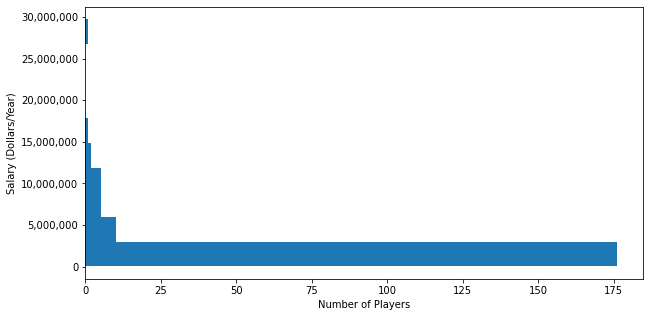

In [27]:
low_games = ballers_new[ballers_new['G'] < 4]
fig, ax = plt.subplots(figsize=(10,5))
plt.hist(low_games.Salary, orientation = 'horizontal')
plt.xlabel( "Number of Players")
plt.ylabel("Salary (Dollars/Year)")
ax.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

In [28]:
low_games.sort_values(['Salary'], ascending=(False)).head(30)

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,WS,WS48,OBPM,DBPM,BPM,VORP,ORtg,DRtg,Year,Salary
4224,Gordon Hayward,SF,27,BOS,1,1,5.0,1.0,2.0,0.500,...,0.0,0.056,-6.6,-0.8,-7.4,0.0,99.0,107.0,2018,29727900.0
4147,Luol Deng,SF,32,LAL,1,1,13.0,1.0,2.0,0.500,...,0.0,-0.018,-5.3,2.4,-2.9,0.0,77.0,109.0,2018,17190000.0
17,Gilbert Arenas,PG,27,WAS,2,2,31.5,3.0,11.5,0.261,...,0.2,0.115,3.0,-2.2,0.8,0.0,116.0,117.0,2009,14653466.0
4313,Jeremy Lin,PG,29,BRK,1,1,25.0,5.0,12.0,0.417,...,0.0,0.087,-1.0,-4.4,-5.4,0.0,110.0,119.0,2018,12000000.0
5647,Spencer Dinwiddie,SG,27,BRK,3,3,21.3,2.0,5.3,0.375,...,0.1,0.047,-3.4,2.0,-1.4,0.0,103.0,112.0,2021,11454048.0
92,Eddy Curry,C,26,NYK,3,0,4.0,0.7,0.7,1.000,...,0.0,-0.064,-13.2,0.8,-12.4,0.0,77.0,107.0,2009,9723983.0
3045,Tyrus Thomas,PF,28,MEM,2,0,3.5,0.5,0.5,1.000,...,0.1,0.477,11.2,7.3,18.5,0.0,224.0,112.0,2015,9460664.0
3584,Jerryd Bayless,PG,28,PHI,3,1,23.7,3.7,10.7,0.344,...,-0.1,-0.067,-2.1,-2.4,-4.4,0.0,90.0,114.0,2017,9424084.0
5804,Meyers Leonard,C,28,MIA,3,2,9.7,1.0,2.3,0.429,...,0.0,0.042,-3.5,-0.9,-4.4,0.0,101.0,112.0,2021,9400000.0
5892,Jabari Parker,PF,25,SAC,3,0,9.0,1.3,2.3,0.571,...,0.0,-0.077,-7.5,-1.3,-8.8,0.0,83.0,119.0,2021,6500000.0


In [29]:
#Checking salary ranges. Salaries spanning 26k to 2,30
ballers_new.Salary.describe()

count    6.029000e+03
mean     5.330851e+06
std      6.404464e+06
min      2.402200e+04
25%      1.156320e+06
50%      2.760094e+06
75%      7.026240e+06
max      4.300636e+07
Name: Salary, dtype: float64

### Salary's Important Features

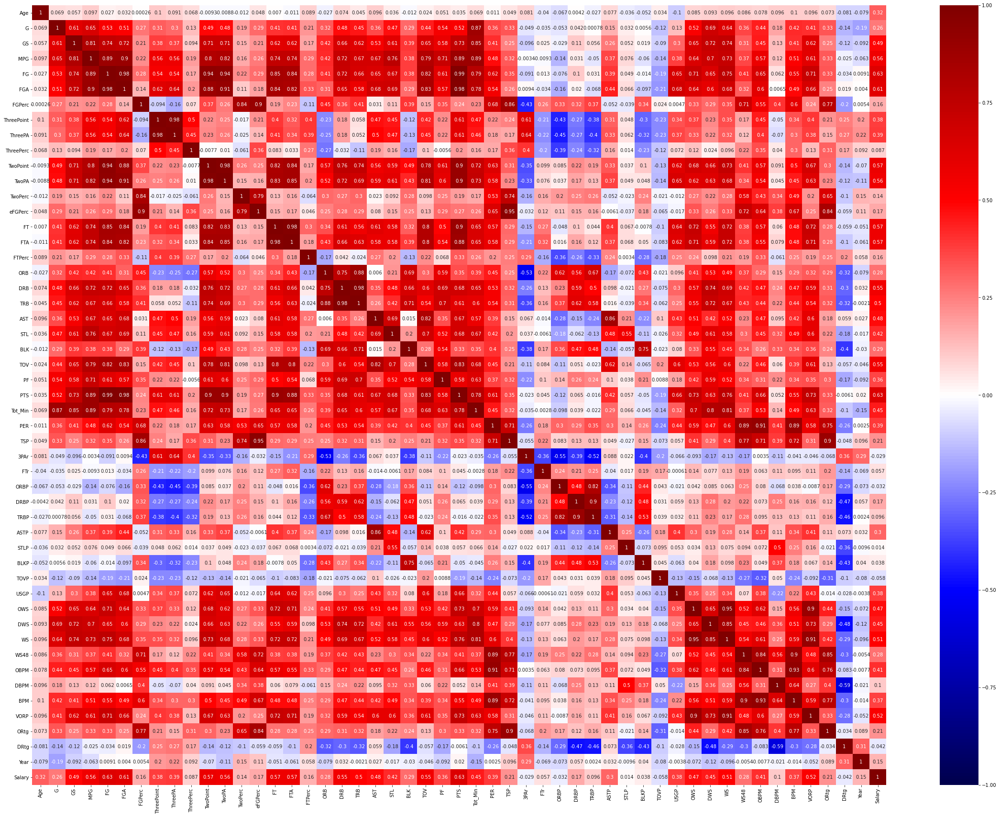

In [30]:
play_heat = ballers_new.drop(columns=['Player',"Pos","Tm",])
plt.figure(figsize=(40, 30))
sns.heatmap(play_heat.corr(), cmap="seismic", annot=True, vmin=-1, vmax=1);

Looking at the heat map, if we look at the last row of salary, it looks like our weakest section is actually a majority of the advanced statistics, these appear to be estimates of percentages that certain events (i.e. steals, rebounds) will happen when a player is on the floor.  This is quite a large graph however, so let's zoom in as to what the Salary related correlations looked like in order of attributes. 

In [31]:
#Let's take a look at the highest correlation categories with the salary metric
corr_ranks = play_heat.corr()
corr_ranks['Salary'].sort_values(ascending=False)

Salary        1.000000
PTS           0.634426
FG            0.627054
FGA           0.612085
TwoPoint      0.571980
FT            0.570212
FTA           0.565425
MPG           0.559753
TwoPA         0.558383
TOV           0.554548
DRB           0.552698
VORP          0.520006
WS            0.506532
TRB           0.495887
GS            0.487451
AST           0.484264
OWS           0.472426
Tot_Min       0.449946
DWS           0.447588
STL           0.419843
OBPM          0.410143
PER           0.389227
ThreePA       0.387322
ThreePoint    0.381634
USGP          0.376621
BPM           0.370738
PF            0.361891
Age           0.315505
ASTP          0.296992
BLK           0.288680
ORB           0.279900
WS48          0.275012
G             0.264551
ORtg          0.211800
TSP           0.211216
eFGPerc       0.169944
DRBP          0.166513
FGPerc        0.161394
FTPerc        0.156108
Year          0.146868
TwoPerc       0.139071
DBPM          0.101590
TRBP          0.095593
ThreePerc  

Scoring categories appear to be most important in this data set so before we start declaring the important features, we should look to see if these are colinearity candidates. We may only need one item from particular categories to help the model stability. 

But before we dive into colinearity, lets compare the recent three years (2019-2021) to the first three years (2009-2011) in the data set to see if the game has shifted in terms of what factors are important in relation to salary

In [32]:
#Measure 2008-2010 and 2019-2021 correlations of features to salary
data_set = ballers_new.drop(columns=['Player',"Pos","Tm",])
data_set080910 = data_set[data_set["Year"] < 2011]
data_set192021 = data_set[data_set["Year"] > 2019]

game_diff = data_set192021.corr() - data_set080910.corr()
game_diff.Salary.sort_values(ascending=False)

ThreePA       0.238278
ThreePoint    0.236988
AST           0.226908
ASTP          0.209655
TOV           0.118057
PTS           0.112199
STL           0.111113
USGP          0.110704
FGA           0.110244
FT            0.108113
FG            0.101639
OBPM          0.089997
VORP          0.088604
DRtg          0.088565
FTA           0.084244
ThreePerc     0.080026
TwoPA         0.073663
GS            0.072123
G             0.071857
MPG           0.071324
PER           0.069833
OWS           0.066604
Tot_Min       0.060216
TwoPoint      0.059856
TOVP          0.055353
FTPerc        0.053168
WS            0.050155
BPM           0.038729
TRB           0.036841
DRB           0.036043
PF            0.033366
Age           0.032418
Year          0.029434
STLP          0.017163
ORtg          0.016427
TSP           0.007787
eFGPerc       0.007187
ORBP          0.005444
WS48          0.004370
FGPerc        0.002088
DWS           0.000670
Salary        0.000000
TRBP         -0.003218
ORB        

Wow, so within the last ten years there's been a .23 increase in the importance of three pointers and a .05 importance of two pointers.  This has come as teams like Golden State have acquired shooters and used the Expected value of 3s * % of going in vs 2s * % and shifted the game towards more threes.  Assists come in third for increased correlation with salary at .22. In terms of factors that have decreased in importance, the biggest losers have been field goal percentage on two pointers and Blocks.

Let's zoom back in on the heat map, looking at the various sections vs Salary. We will look for colinearity in these buckets and the distributions vs salary to get an idea of what and how we want to model features.

In [33]:
#Splitting data frame as too many columns for seaborn to produce a graph, chunks of columns with salary in each
#Looking at all scoring columns vs salary
trad_feat = ballers_new[[ 'Age','G','GS','MPG','Tot_Min','PTS','FG','FGA','FGPerc','ThreePoint','ThreePA','ThreePerc','TwoPoint','TwoPA','TwoPerc','eFGPerc','FT','FTA','FTPerc','Salary']]
non_score_adv_feat = ballers_new[['ORB','DRB','TRB','AST','STL','BLK','TOV','PF','PER','TSP','3PAr','FTr','ORBP','DRBP','TRBP','ASTP','STLP','BLKP','TOVP','Salary']]
usg_efficient = ballers_new[['USGP','OWS','DWS','WS','WS48','OBPM','DBPM','BPM','VORP','ORtg','DRtg','Year','Salary']]


## Colinearity and Feature/Target Distributions

Given the heat map above is alot of information and is hard to pick out, lets zoom on specific categories.  We've broken them into three buckets.

Definitions for the categories can be found here: https://www.basketball-reference.com/about/glossary.html

1) **Availability & Scoring** - Things like games player, minutes, points and where those points came from

2) **Non Scoring & Advanced Stats** - Non-scoring items like assists, rebounds and turnovers (mistakes) along with defensive categories and "advanced" metrics which are formulas using the underlying basic categories in buckets 1 and 2.

3) **Usage & Efficiency** - Team related measurements that again use underlying simple stats of an individual players in buckets 1 and 2 but also incoporate team success relative to league and how that translates to an individual player

### Scoring & Availability

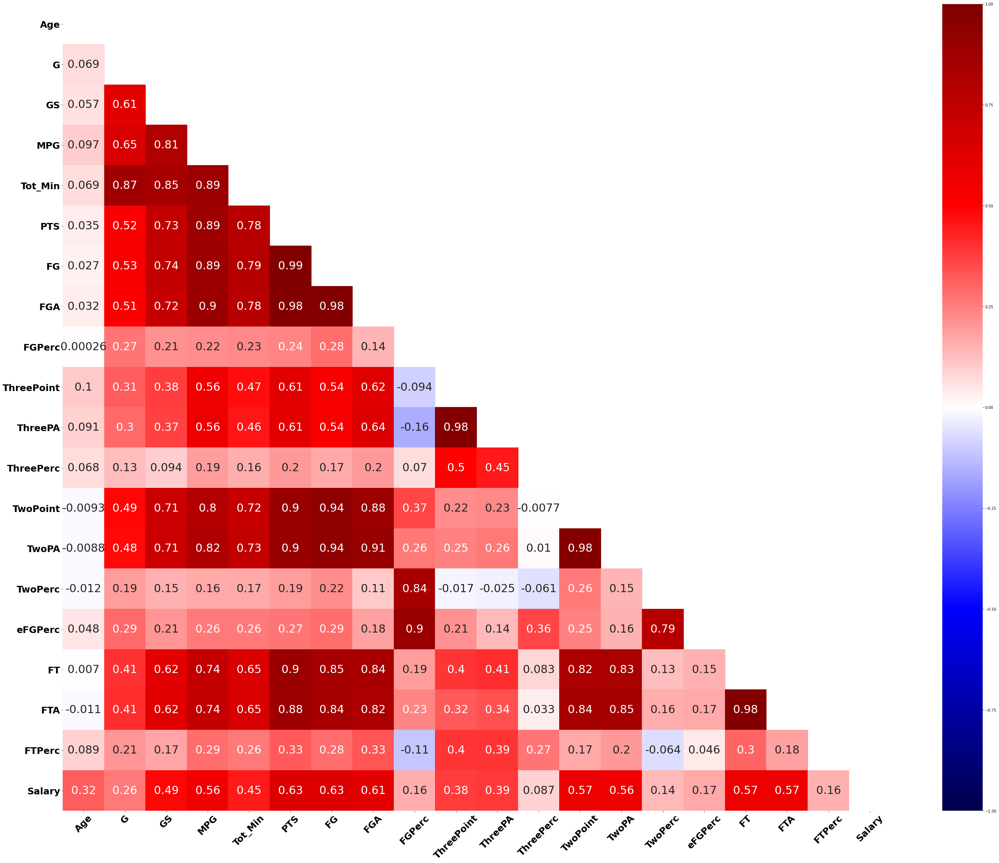

In [34]:
#https://seaborn.pydata.org/generated/seaborn.heatmap.html - mask section
#Don't double count the data and zoom in to see where the colinearity might be
corr_ranks1 = trad_feat.corr()
mask = np.zeros_like(corr_ranks1,dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(50, 40))
ax = sns.heatmap(corr_ranks1, mask=mask,cmap='seismic', vmin=-1, vmax=1, annot=True,annot_kws={"fontsize":30,})
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=25, rotation=45,fontweight="bold")
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=25, rotation=0,fontweight="bold")
plt.show()


**Availability: Age, Games (G), Games Started (GS), Minutes Per Game (MPG), Total Minutes Played (Tot_Min)**

Total Minutes correlates highly with Minutes Per Game, Games Started and Games total.  This makes complete sense and we probably only need one or two of these.  Seeing the floor should be a direct relation to how valuable the player is (good players play) but total minutes could be miscontrued as it could be impacted by injuries/playoffs/rest.  So really this is an availability measure and since MPG has highest correlation of the four it has me most interested to use from this bucket 

Distribution (pair plots below) wise most of the time related metrics appear to be linear while the distribution for Age vs Salary appears to look normalish, with a high concentration of players in their late 20s to early 30s (aka prime of their careers) as younger players ready to play are rare and many players retire when their physicality no longer keeps up. 

**Scoring Pt1: Points(PTs), Field Goals (FG), Field Goals Attempt (FGA), Field Goal % (FGPerc)**

Our three highest correlated items to salary are near one in correlation (can only score if you attempt and make field goals which include two and three pointers).  For now Points will come out of this bucket, BUT we may want to look at point components vs points to see if there are better options there.

For disrtibutions the points/field goals/field goal attempts all appear to be linear in relation to salary while field goal percent looks to be on a normal distribution (and wasn't a high correlation to salary).  

**Scoring Pt2: 3 Pointers(3P), 3 Point Attempt(3PA),  3 Point %(3Perc), 2 Pointers(2P), 2 Point Attempt(2PA),  2 Point %(2Perc), Effective Field Goal % (eFGPerc)**

So it looks like amongth the cateories here we can ditch the percents as they have lower relation to salary.  Looking at the 2008-2010 data its surprising how little correlation 3Pointers have towards salary (before the game started moving more to the perimeter).  2Point category looks pretty close to points as does FT and FTA.  I think keeping in 2P and 3P could be interesting to watch across time horizons and free throws to me are another category that shows how good a player is at drawing the defense into mistakes.  While twos and free throws are correlated, I am guessing that using these three buckets as opposed to total points may be a good route to explore

For the distribution impact again points, attempts appear to be linear while 2 and 3 point percents look like they are normally distrubuted vs salary. Free throws on the other hand, including percent, free throws and attempts all appear to be more linearish relative to what we saw for the other scoring categories



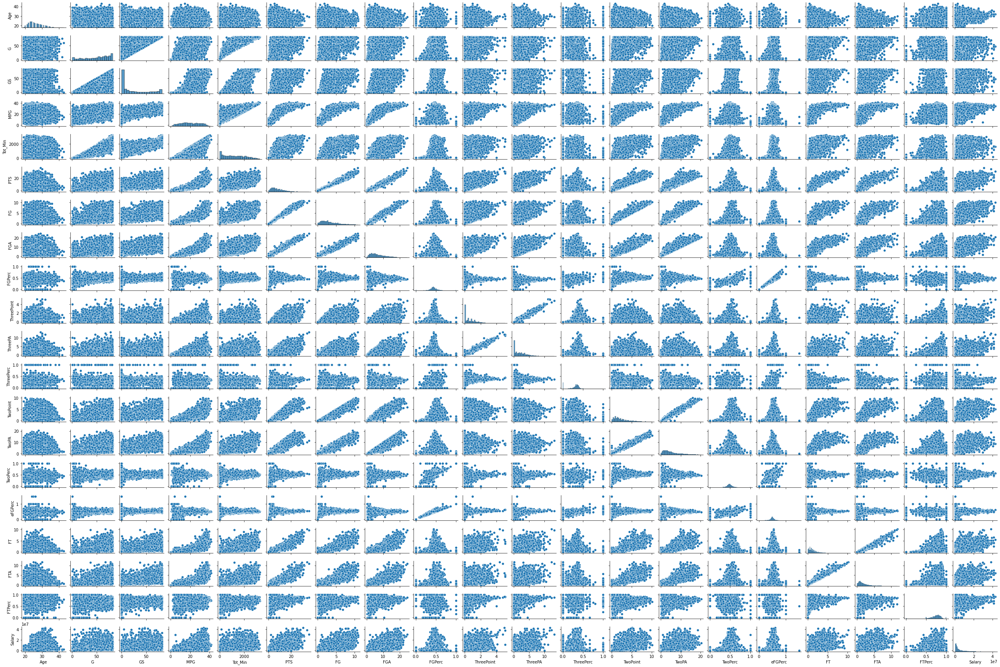

In [35]:
sns.pairplot(trad_feat, height=1.2, aspect=1.5);

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


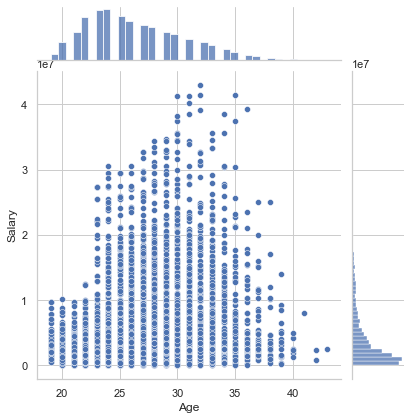

In [182]:

n = sns.jointplot(ballers_new.Age, ballers_new.Salary)

### Non Scoring & Advanced Stats

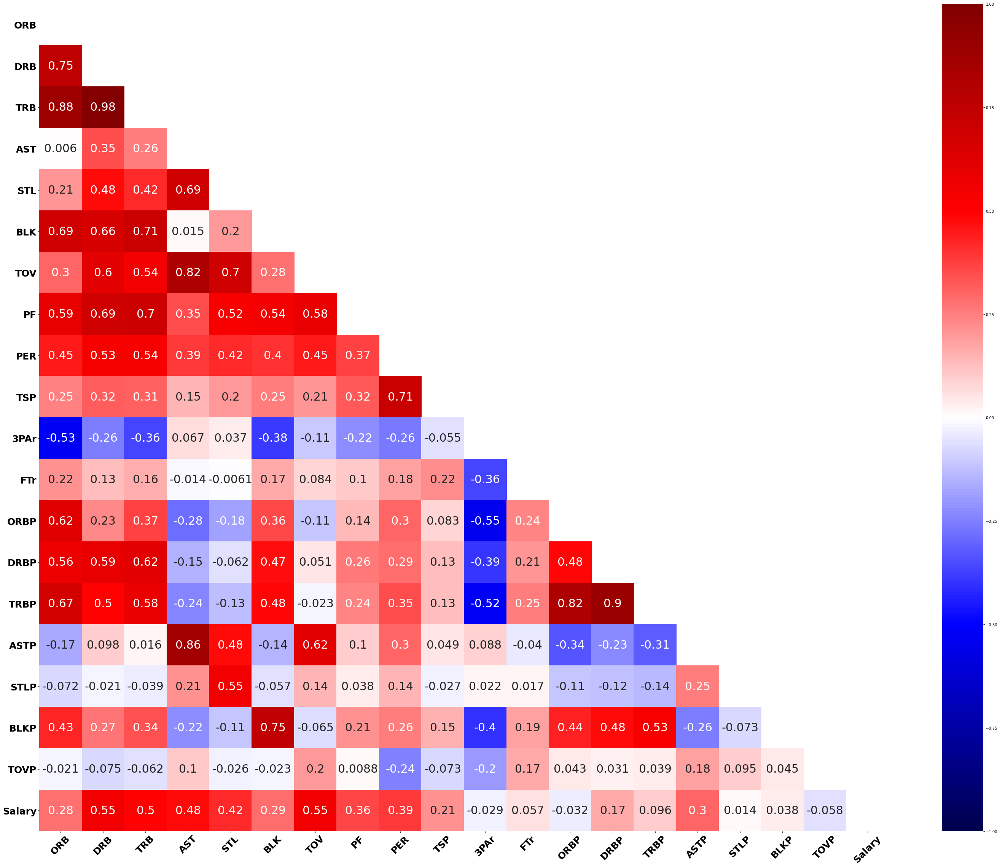

In [36]:
corr_ranks2 = non_score_adv_feat.corr()
mask = np.zeros_like(corr_ranks2,dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(50, 40))
ax = sns.heatmap(corr_ranks2, mask=mask,cmap='seismic', vmin=-1, vmax=1, annot=True,annot_kws={"fontsize":30,})
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=25, rotation=45,fontweight="bold")
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=25, rotation=0,fontweight="bold")
plt.show()

**Rebounding: Offensive Rebounding (ORB), Defensive Rebounding (DRB), Total Rebounds (TRB)**

From the rebounding bucket, no surprise that the three categories are highly correlated with defensive rebounding being the most correlated to salary. Similar to points have a decision here to just use TRB or the two components. 

**Other Stats: Points(AST), Steals (STL), Blocks (BLK), Turnovers(TOV), Fouls (PF)**

So far this is the most puzzling group.  Assists and steals and blocks seem to be lower correlation to salary but still in that next bucket after scoring and rebounds. Assists help show ability to work with teammates, while steald and blocks are important defensive measurements I assumed I would include going in.  The Turnovers and personal foul correlations to salary are surprising. I would think they would be negative (ie. good players do make mistakes and foul other players).  It could be true that players who are better more have the ball more and therefore more opportunities to lose the ball. The personal foul one is puzzling.

**Advanced Stats: Per-Minute-Rating(PER), True Shooting %(TS),  3 Point Attempt Rate(3PAr), Free Throw Rate(FTr), Offense Rebound Percent (ORBP), Defense Rebound Percent (DRBP), Total Rebound Percent (TRB), Assist Percent(ASTP), Block Percent (BLKP), Turnover Percent(TOVP)**

Most of these advanced statistics are either redundant and/or not very correlated with salary.  PER is an interesting but under the hood its really just math on a bunch of categories we've already looked at (i.e Pts, Assists, ect) but standardizied for the league and normalized into a relative rating amongst the rest of the league (with 15 being average).  This makes Per most likely the only one we'd choose from just looking at this.

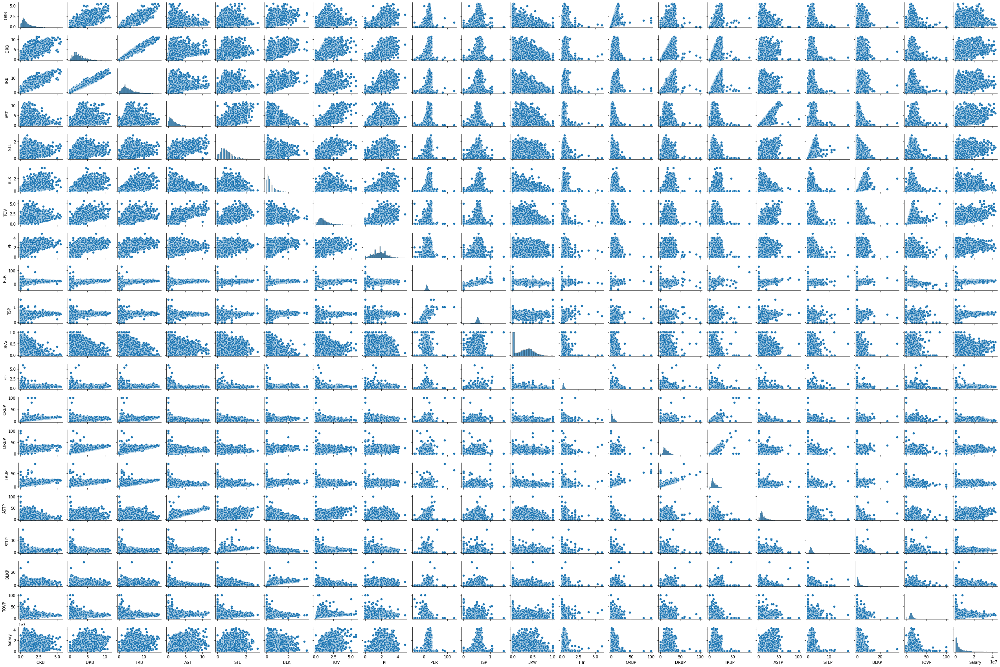

In [37]:
sns.pairplot(non_score_adv_feat, height=1.2, aspect=1.5);

### Usage & Efficiency Ratings

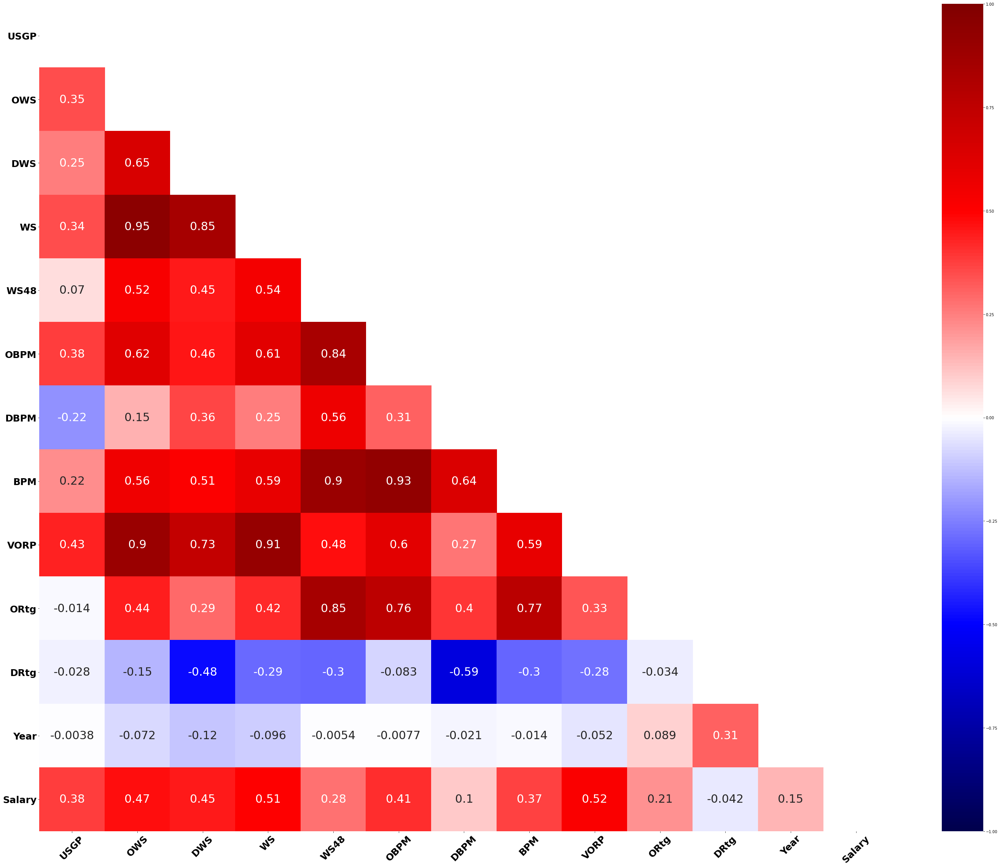

In [38]:
corr_ranks3 = usg_efficient.corr()
mask = np.zeros_like(corr_ranks3,dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(50, 40))
ax = sns.heatmap(corr_ranks3, mask=mask,cmap='seismic', vmin=-1, vmax=1, annot=True,annot_kws={"fontsize":30,})
ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=25, rotation=45,fontweight="bold")
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=25, rotation=0,fontweight="bold")
plt.show()


**Usage & Win Shares: Usage % (USGP), Defense Win Shares(DWS), Offense Win Shares(OWS), Win Shares(WS), Win Share per 48 Min (WS48)**

Usage represents how much of a teams positions a player is used (also a formula of factors we've reviewed above).  So we will see it have a decent correlation ~.60 with point and minute categories.  Win shares are a bit more complicated (https://www.reddit.com/r/nba/comments/2bv4cp/stats_101_win_shares/).  The goal of these stat is to reguarlize league averages in points on offense and given up and defense adjusted for a league average pace.  Then a players deviation above or below this deviation is applied to their teams performance vs average to back into wins this player contributed  (reltiavely).  A few flaws with this statistic is offense is favored over defense (consistent with most of the categories so far) and good teams will appear better (i.e. they have more players).  You can be a really good player who deserves a big pay day on a terrible team.  However, these stats are about as close as we can get to incorporating good team dynamics (along with assists). Total win and win shares per 48 minutes become redundant when we use the above. 

**Plus/Minus (+/-): Offensive +/-(OBPM), Defensive +/-(DBPM), Total +/-(BPM),**

Plus minus is standardizing a players impact on the team when they are on the floor.  Does the team score more than they get scored on or do they score more.  Again this could be a good team level look in, but to capture offense and defense I would ske towards Total Box Plus as its similar to offensive in correlation to salary but includes both ends of the floor. 

**Ratings and Years: Offensive Rating (OTRG), Defensive Rating (DTRG), Year**

Efficiency ratings are just trying to show how many points per 100 possessions a player would help score or give up.  These are similar aggregations/formulas from other value but also include things like deflections on defense.  I think both of the low correlations are surprising, but defensive being negative on salary impact makes sense.  Lower defensive efficiency means you give up less points.  Because we are low on defensive metrics, I am intrigued to keep this in and see how this performs. Year will be used as the salary change across time has been significant factoring in new revenue and inflation.

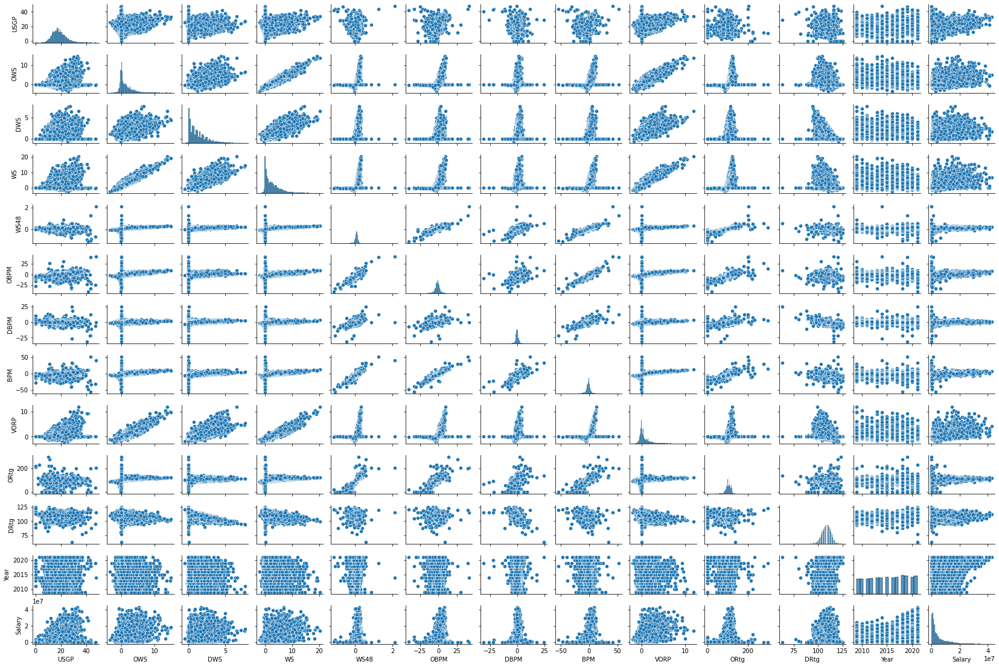

In [39]:
sns.pairplot(usg_efficient, height=1.2, aspect=1.5);

### Position Groups / Salary

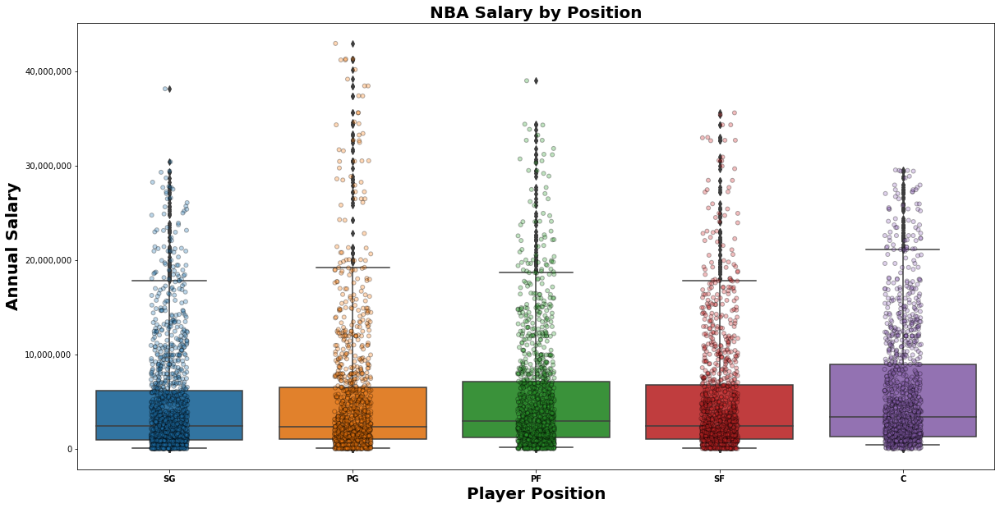

In [40]:
#Create Manhattan Boxplots across seasonlity to look at ranges/means/medians of MTA traffic
fig, axs = plt.subplots(figsize=[20, 10])

sns.stripplot(x=ballers_new['Pos'], y=ballers_new['Salary'], data=pd.melt(ballers_new), marker="o", alpha=0.3,jitter=True,
dodge=True,linewidth=1,edgecolor='black')
boxplot = sns.boxplot(x=ballers_new['Pos'], y=ballers_new['Salary'],whis=[5,95])
boxplot.axes.set_title("NBA Salary by Position", fontsize=20, fontweight='bold')

boxplot.set_xlabel("Player Position", fontsize=20, fontweight='bold')
boxplot.set_ylabel("Annual Salary", fontsize=20, fontweight='bold')
boxplot.set_xticklabels(ballers_new['Pos'].unique(),fontweight='bold')
axs.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
plt.show()

Looking at the above at first glance it appears the taller the better, on average.  Centers appear to have a slightly higher mean and larger 25-75 percentile range.  However at the extremes, it appears the best players in the league from a compensation standpoint play Point Guard, Small Forward and then Power Forward.

### Team/Market

In [41]:
len_year = ballers_new.Year.unique()
teams = ballers_new.groupby("Tm").agg(np.mean).sort_values('Salary', ascending=False).reset_index()
teams = teams[teams['Tm'] != 'TOT']

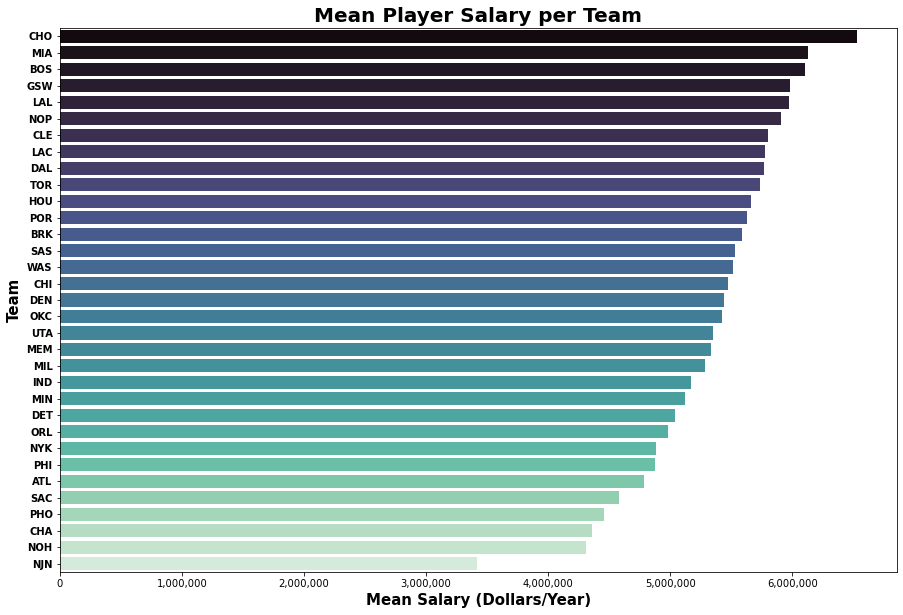

In [42]:
fig, ax = plt.subplots(figsize=(15,10))

sns.barplot(x=teams.Salary, y=teams.Tm, ax=ax,palette="mako")
ax.get_xaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set_xlabel('Mean Salary (Dollars/Year)',fontsize=15, fontweight='bold')
ax.set_ylabel('Team',fontsize=15, fontweight='bold')

ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=10,fontweight="bold")
ax.set_title('Mean Player Salary per Team',fontsize=20, fontweight='bold')


plt.show()

A couple things to note.  While Charlotte appears to have the highest salary in the league, keep in mind they changed their franchise name in 2014, so their salary data will be skewed higher with inflation and higher revenies (vs same franchise listed as 'CHA).  Additionally the New Jersey Nets (NJN) became the Brooklyn Nets in 2012. New Orleans also had duel teams with NOH representing the New Orleans Hornets until 2013 and the NOP representing the New Orleans Pelicans after that point.

The thing I was expecting to see out of this graph was do cities have the highest payrolls and that doesn't appear to be the case across the board with Chicago, New York, and Los Angeles Clippers all in the middle of the pack.

What we do notice is teams that have been good and won or competed consistently for championships over the last ten years (Miami, Toronto, Golden State, Cleveland, LA Lakers, Boston and San Antonio) appear to have some of the highest mean payrolls. 

## Salary Target Distribution

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'Salary (millions)'), Text(0, 0.5, 'Frequency')]

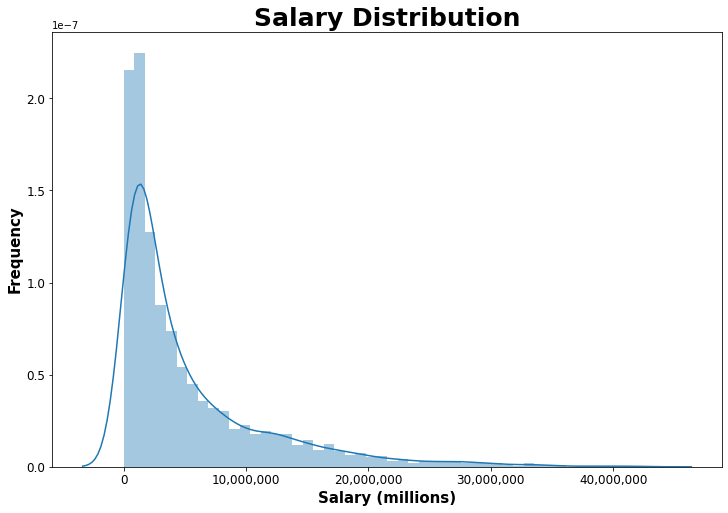

In [43]:
#Lets check the newly imported salary data for distribution type
fig, ax = plt.subplots(figsize=(12,8))
ax.get_xaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax = sns.distplot(x=ballers_new.Salary);
ax.set_xlabel('Salary (millions)',fontsize=15, fontweight='bold')
ax.set_ylabel('Frequency',fontsize=15, fontweight='bold')
ax.xaxis.set_tick_params(labelsize=12,)
ax.yaxis.set_tick_params(labelsize=12)
plt.title("Salary Distribution",fontweight='bold', fontsize=25)
ax.set(xlabel='Salary (millions)', ylabel='Frequency')

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'log salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'log salary distribution')]

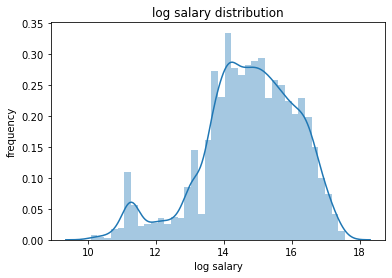

In [44]:
#Rigth skewed data makes sense,as most players make under 
ax = sns.distplot(x=(np.log(ballers_new.Salary)));
ax.set(xlabel='log salary', ylabel='frequency', title='log salary distribution')

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'sqrt salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'square root salary distribution')]

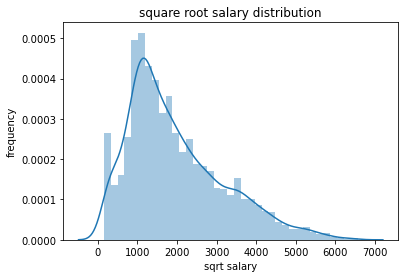

In [45]:
ax = sns.distplot(x=(np.sqrt(ballers_new.Salary)));
ax.set(xlabel='sqrt salary', ylabel='frequency', title='square root salary distribution')

Of the three distributions above it appears that square root and log salary have more normalish distribution then salary alone.  We can test in our modeling testing when get into it to see if produces a more accurate model.

### Adding Positional Dummies

We will first add dummy variables for the postions to our data frame.  I have made the choice not to include team salary dummy variables but will revisit if I think they are leveraging.

In [46]:
pos_dum =patsy.dmatrix('Pos',data=ballers_new,return_type='dataframe')
pos_dum.head()

,Intercept,Pos[T.PF],Pos[T.PG],Pos[T.SF],Pos[T.SG]
0,1.0,0.0,0.0,0.0,1.0
1,1.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,0.0,1.0
4,1.0,0.0,1.0,0.0,0.0


In [47]:
ballers_dummy = ballers_new.join(pos_dum)

In [48]:
#preview dummy changes
ballers_dummy

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,VORP,ORtg,DRtg,Year,Salary,Intercept,Pos[T.PF],Pos[T.PG],Pos[T.SF],Pos[T.SG]
0,Alex Acker,SG,26,TOT,25,0,8.0,1.2,3.0,0.395,...,-0.1,94.0,114.0,2009,711517.0,1.0,0.0,0.0,0.0,1.0
1,Hassan Adams,SG,24,TOR,12,0,4.3,0.3,1.1,0.308,...,-0.1,63.0,111.0,2009,297163.0,1.0,0.0,0.0,0.0,1.0
2,Arron Afflalo,SG,23,DET,74,8,16.7,1.8,4.1,0.437,...,-0.2,107.0,110.0,2009,1015440.0,1.0,0.0,0.0,0.0,1.0
3,Maurice Ager,SG,24,NJN,20,0,4.9,0.8,2.2,0.349,...,-0.2,77.0,115.0,2009,1042440.0,1.0,0.0,0.0,0.0,1.0
4,Blake Ahearn,PG,24,SAS,3,0,6.3,0.7,2.0,0.333,...,0.0,113.0,104.0,2009,125562.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6024,Delon Wright,SG,28,TOT,46,31,27.1,3.5,7.6,0.453,...,1.2,118.0,112.0,2021,9000000.0,1.0,0.0,0.0,0.0,1.0
6025,Thaddeus Young,PF,32,CHI,50,17,24.7,5.5,9.5,0.581,...,1.7,118.0,110.0,2021,13545000.0,1.0,1.0,0.0,0.0,0.0
6026,Trae Young,PG,22,ATL,50,50,34.3,7.8,17.8,0.435,...,2.4,116.0,116.0,2021,6571800.0,1.0,0.0,1.0,0.0,0.0
6027,Cody Zeller,C,28,CHO,35,20,21.4,3.7,6.8,0.540,...,0.4,123.0,111.0,2021,15415730.0,1.0,0.0,0.0,0.0,0.0


# Modeling

### Figuring out what to do with low game outliers and nulls

The much anticipated and teases decision to look at outliers has come, for this we will use a simple stats model, but first, let's break our data into a train and test set

In [49]:
#Put a zero in for all blanks and include as original data set
ballers_zeros = ballers_dummy.fillna(value=0) #Put zeros in place of blanks
ballers_zeros = ballers_zeros.drop(['Player','Tm','Pos'],axis=1)

#Take out players with less than 4 games and then apply zeros to all players
ballers_no_low = ballers_dummy[ballers_dummy['G'] > 4] #Only include players with more than 4 games
ballers_no_low_zero = ballers_no_low.fillna(value=0) #Now fill with 0s
ballers_no_low_zero = ballers_no_low_zero.drop(['Player','Tm','Pos'],axis=1)

First we look at a quick stats model on the entire training set just **replacing all null values with 0s**

In [50]:
#Split data into 80% Train Set and the Remaining as 20% for the Test Set
X_low, y_low = ballers_zeros.drop('Salary',axis=1), ballers_zeros['Salary']

# hold out 20% of the data for final testing
X_low, X_test_low, y_low, y_test_low = train_test_split(X_low, y_low, test_size=.2, random_state=10)

In [51]:
#split data in to train / val and use train to look at outlier impact
X_low_train, X_low_val, y_low_train, y_low_val = train_test_split(X_low, y_low, test_size=.25, random_state=10)

In [52]:
y = y_low_train
x = X_low_train

lsm = sm.OLS(y,sm.add_constant(x))

fit = lsm.fit()

fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Salary   R-squared:                       0.592
Model:                            OLS   Adj. R-squared:                  0.586
Method:                 Least Squares   F-statistic:                     95.60
Date:                Thu, 15 Apr 2021   Prob (F-statistic):               0.00
Time:                        18:27:09   Log-Likelihood:                -60208.
No. Observations:                3617   AIC:                         1.205e+05
Df Residuals:                    3562   BIC:                         1.209e+05
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Age         4.394e+05   1.75e+04     25.110      0.000    4.05e+05    4.74e+05
G           1.978e+04   9678.467      2.044      0.041     804.529    3.88e+04
GS          2.722e+04   5537.656      4.916      0.000    1.64e+04    3.81e+04
MPG        -1.193e+05      5e+04     -2.387      0.017   -2.17e+05   -2.13e+04
FG          1.533e+06   2.27e+06      0.675      0.499   -2.92e+06    5.98e+06
FGA         3.334e+06    1.5e+06      2.221      0.026    3.91e+05    6.28e+06
FGPerc       3.71e+06   8.24e+06      0.450      0.653   -1.25e+07    1.99e+07
ThreePoint  7.086e+05   2.03e+06      0.349      0.727   -3.27e+06    4.69e+06
ThreePA    -3.043e+06   1.51e+06     -2.017      0.044      -6e+06   -8.46e+04
ThreePerc  -6.267e+05   6.62e+05     -0.946      0.344   -1.92e+06    6.72e+05
TwoPoint    2.835e+05   1.63e+06      0.174      0.862   -2.91e+06    3.47e+06
TwoPA       -3.69e+06    1.5e+06     -2.453      0.014   -6.64e+06    -7.4e+05
TwoPerc     -5.87e+05   1.56e+06     -0.377      0.706   -3.64e+06    2.47e+06
eFGPerc     9.792e+05   7.57e+06      0.129      0.897   -1.39e+07    1.58e+07
FT          1.206e+06   1.01e+06      1.197      0.231    -7.7e+05    3.18e+06
FTA        -1.979e+05   3.32e+05     -0.596      0.551   -8.49e+05    4.53e+05
FTPerc     -6.669e+05   5.52e+05     -1.207      0.227   -1.75e+06    4.16e+05
ORB        -3.546e+05   1.43e+06     -0.247      0.805   -3.16e+06    2.46e+06
DRB         8.089e+05   1.42e+06      0.571      0.568   -1.97e+06    3.59e+06
TRB         2.601e+05   1.41e+06      0.184      0.854   -2.51e+06    3.03e+06
AST         1.745e+06   1.69e+05     10.342      0.000    1.41e+06    2.08e+06
STL         4.511e+05   4.95e+05      0.912      0.362   -5.19e+05    1.42e+06
BLK         1.978e+06   4.37e+05      4.524      0.000    1.12e+06    2.84e+06
TOV        -1.015e+06   3.91e+05     -2.596      0.009   -1.78e+06   -2.48e+05
PF         -1.648e+06      2e+05     -8.249      0.000   -2.04e+06   -1.26e+06
PTS         2.265e+04   9.68e+05      0.023      0.981   -1.88e+06    1.92e+06
Tot_Min    -3059.1972    540.778     -5.657      0.000   -4119.463   -1998.932
PER        -4.978e+05   1.13e+05     -4.405      0.000   -7.19e+05   -2.76e+05
TSP        -5.441e+06   4.04e+06     -1.348      0.178   -1.34e+07    2.47e+06
3PAr       -2.171e+06   1.31e+06     -1.662      0.097   -4.73e+06     3.9e+05
FTr         2.945e+05   4.03e+05      0.730      0.465   -4.96e+05    1.09e+06
ORBP       -4.693e+04   1.63e+05     -0.287      0.774   -3.67e+05    2.74e+05
DRBP       -1.736e+05    1.5e+05     -1.154      0.249   -4.68e+05    1.21e+05
TRBP        3.121e+05   2.91e+05      1.072      0.284   -2.59e+05    8.83e+05
ASTP       -1.083e+05   2.34e+04     -4.630      0.000   -1.54e+05   -6.24e+04
STLP        2.189e+04   1.72e+05      0.127      0.899   -3.16e+05     3.6e+05
BL

Next we look at eliminating players with **under 4 games and replacing the balance of players missing values with 0s**

In [53]:
#Split data into 80% Train Set and the Remaining as 20% for the Test Set
X_low, y_low = ballers_no_low_zero.drop('Salary',axis=1), ballers_no_low_zero['Salary']

# hold out 20% of the data for final testing
X_low, X_test_low, y_low, y_test_low = train_test_split(X_low, y_low, test_size=.2, random_state=10)

In [54]:
#split data in to train / val and use train to look at outlier impact
X_low_train, X_low_val, y_low_train, y_low_val = train_test_split(X_low, y_low, test_size=.25, random_state=10)

In [55]:
y = y_low_train
x = X_low_train

lsm = sm.OLS(y,sm.add_constant(x))
fit = lsm.fit()
fit.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Salary   R-squared:                       0.605
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     96.85
Date:                Thu, 15 Apr 2021   Prob (F-statistic):               0.00
Time:                        18:27:10   Log-Likelihood:                -57697.
No. Observations:                3465   AIC:                         1.155e+05
Df Residuals:                    3410   BIC:                         1.158e+05
Df Model:                          54                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Age         4.494e+05   1.84e+04     24.479      0.000    4.13e+05    4.85e+05
G           1.578e+04   1.11e+04      1.419      0.156   -6024.395    3.76e+04
GS          3.436e+04   5692.109      6.037      0.000    2.32e+04    4.55e+04
MPG        -1.293e+05   5.85e+04     -2.209      0.027   -2.44e+05   -1.45e+04
FG          3.817e+05   2.29e+06      0.167      0.867    -4.1e+06    4.86e+06
FGA         4.061e+06   1.52e+06      2.671      0.008    1.08e+06    7.04e+06
FGPerc       8.37e+06   1.46e+07      0.574      0.566   -2.02e+07     3.7e+07
ThreePoint -5.813e+05    2.1e+06     -0.277      0.782    -4.7e+06    3.53e+06
ThreePA    -3.784e+06   1.53e+06     -2.470      0.014   -6.79e+06    -7.8e+05
ThreePerc   -2.49e+05   6.58e+05     -0.378      0.705   -1.54e+06    1.04e+06
TwoPoint    3.786e+05    1.7e+06      0.222      0.824   -2.96e+06    3.72e+06
TwoPA      -4.747e+06   1.52e+06     -3.113      0.002   -7.74e+06   -1.76e+06
TwoPerc    -3.392e+06   2.22e+06     -1.529      0.126   -7.74e+06    9.59e+05
eFGPerc     2.488e+06   1.34e+07      0.186      0.852   -2.37e+07    2.87e+07
FT          8.679e+05   1.03e+06      0.840      0.401   -1.16e+06    2.89e+06
FTA        -7.617e+05   3.61e+05     -2.111      0.035   -1.47e+06   -5.42e+04
FTPerc     -8.959e+05   6.84e+05     -1.309      0.191   -2.24e+06    4.46e+05
ORB         7.504e+05   1.45e+06      0.516      0.606    -2.1e+06     3.6e+06
DRB         1.508e+06   1.44e+06      1.047      0.295   -1.32e+06    4.33e+06
TRB        -3.813e+05   1.43e+06     -0.267      0.790   -3.18e+06    2.42e+06
AST         1.962e+06   2.02e+05      9.704      0.000    1.57e+06    2.36e+06
STL         1.348e+05   6.17e+05      0.218      0.827   -1.08e+06    1.34e+06
BLK         1.991e+06   5.01e+05      3.974      0.000    1.01e+06    2.97e+06
TOV        -1.094e+06   4.35e+05     -2.515      0.012   -1.95e+06   -2.41e+05
PF         -1.807e+06   2.27e+05     -7.945      0.000   -2.25e+06   -1.36e+06
PTS         8.807e+05    9.8e+05      0.899      0.369   -1.04e+06     2.8e+06
Tot_Min    -3210.5626    588.702     -5.454      0.000   -4364.806   -2056.319
PER        -9.478e+05   1.79e+05     -5.282      0.000    -1.3e+06   -5.96e+05
TSP         -2.04e+07   7.25e+06     -2.816      0.005   -3.46e+07   -6.19e+06
3PAr        -2.45e+06   2.45e+06     -1.001      0.317   -7.25e+06    2.35e+06
FTr         6.587e+05   4.89e+05      1.347      0.178      -3e+05    1.62e+06
ORBP        7.704e+05   3.34e+05      2.303      0.021    1.15e+05    1.43e+06
DRBP        7.121e+05   3.13e+05      2.276      0.023    9.88e+04    1.33e+06
TRBP       -1.475e+06   6.33e+05     -2.329      0.020   -2.72e+06   -2.33e+05
ASTP       -1.507e+05   3.92e+04     -3.840      0.000   -2.28e+05   -7.38e+04
STLP        6.954e+05    2.9e+05      2.400      0.016    1.27e+05    1.26e+06
BL

The quick and dirty reading of this is we have about a point better correlation on our data set removing the 4 games first vs just blanket replacing all 0s.  I did not invetigate removing all null categories players because players like Shaquille O'Neal who are very much great players, do not shoot threes and would like to keep them in the data set (nor are they paid for the things that they don't do).  While I may come back to testing this more rigoursly later, for now this will have to do.

<span style="color:blue">**We will proceed removing low game outliers (<4) and replacing nulls withs 0s**</span>.

One thing to note here is that our P-Values are givng us our first look since the heat map as to what we should see as key features.

Age, Games, Games Started, FGA, Three Point Attempts, Two Point Attempts, Two Point %, Assists, Blocks, Turnovers, Personal Fouls, Total Minute, PER Rating, TSP and WS are some of they key categories with low p-values.

Surprisingly rebounds are on the outside looking in and its attempts more then makes that appear to be of more importance. we will watch this as we go and try and confirm it via our feature modeling.

## Modeling - Using All Categories vs Normal Salary

We will keep all features in for now and compare against normal salary now, but see if look at other target distributions make sense at the end (as normal salary is what our stakeholders are most interested in).

In [56]:
ballers_model = ballers_new.join(pos_dum)
ballers_model = ballers_model[ballers_model['G'] > 4] 
ballers_model = ballers_model.fillna(value=0)

In [57]:
ballers_model.columns

Index(['Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year', 'Salary', 'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]'],
      dtype='object')

### Split Train, Validation from Test Set - Salary (Normal)

Up to now we've been cheating a bit for the EDA by looking at all the data, but now rubber meets the court and we must split up our data.

In [58]:
#Split data into 80% Train and Validation Set and the Remaining as 20% for the Test Set
X, y = ballers_model.drop('Salary',axis=1), ballers_model['Salary']

# hold out 20% of the data for final testing
X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=10)

#Strip out player name, team and POS as we've replaced those with dummies
X = X[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]

X_test = X_test[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]


In [59]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=10)

In [60]:
X_train.shape

(3465, 55)

In [61]:
X_val.shape

(1156, 55)

In [62]:
X_test.shape

(1156, 55)

Let's start small with our most basic model from our heat map and observe just how points (the ability) to score works as a model.

In [63]:
features = ['PTS']
J, k = X_train[features], y_train

lm = LinearRegression() # construct LinearRegression model object
lm.fit(J, k) #fit model to our choice of features
fit1 = lm.fit(J, k)
print(lm.intercept_)
print(lm.coef_)

-466647.37299626134
[693676.6774803]


<Figure size 2880x2160 with 0 Axes>

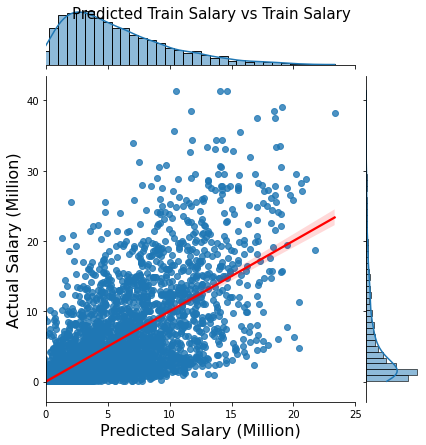

In [64]:
preds = lm.predict(J) # generate predictions (on training data) using fit model


plt.figure(figsize=(40, 30))
g = sns.jointplot(x=(preds/1000000),y=(k/1000000), kind='reg', line_kws={'color':'red'},xlim=(0,25))
g.fig.suptitle('Predicted Train Salary vs Train Salary ', fontsize=15 )
#g.ax_joint.set_xlabel('new x label', fontweight='bold')
g.set_axis_labels('Predicted Salary (Million)', 'Actual Salary (Million)', fontsize=16)

In [65]:
def SSE(actuals, preds):
    return np.sum((actuals - preds)**2)

SSE(y_train,preds)

9.031359711634618e+16

In [66]:
def RMSE(actuals, preds): #root mean squared error
    return np.sqrt(np.mean((actuals - preds)**2))

RMSE(y_train,preds)

5105343.298183551

In [67]:
def MAE(actuals, preds): #mean absolute error
    return np.mean(np.abs(actuals-preds))

MAE(y_train,preds)

3557757.2259692093

In [68]:
def SST(y):
    return np.sum((y_train- np.mean(y_train))**2)

def R2(actuals, preds):
    return 1 - SSE(actuals, preds) / SST(actuals)

R2(y_train,preds)

0.3951580032792186

Text(0, 0.5, 'Residuals')

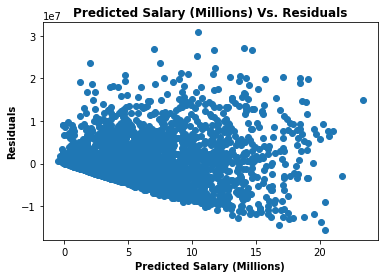

In [69]:
#Look at residuals 
residuals = y_train - preds
plt.scatter(preds/1000000, residuals)
plt.title("Predicted Salary (Millions) Vs. Residuals",fontweight='bold')
plt.xlabel("Predicted Salary (Millions)",fontweight='bold')
plt.ylabel("Residuals",fontweight='bold')

So while scoring was our highest correlated stat with salary in our overall analysis, using it alone only warrants a .38 R^2.  It appears we are also missing saries by nearly 3 million on average with this stat, with much of the highest misses coming for higher income players.

Our residuals see signs of heteroskedasticity; however, the rule of thumb is OLS regression isn't too impacted by heteroscedasticity as long as the maximum variance is not greater than four times the minimum variance (as in this case using simple height comparisons across the x-axis).

The other thing to keep in mind is we know our target distribution is skewed so that could be playing a factor here.  Let's also plot a joint plot to remind ourselves of what points vs Salary looks like (on the train set).

If we look below it looks like points could be something we may look into using a polynomial on as well if we don't believe the issue is on the distrbution end.

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


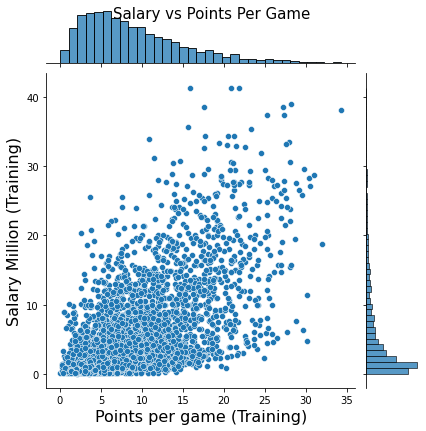

In [70]:
g =sns.jointplot(X_train.PTS, y_train/1000000)
g.fig.suptitle('Salary vs Points Per Game ', fontsize=15 )
g.set_axis_labels( 'Points per game (Training)','Salary Million (Training)', fontsize=16)

plt.show()

## Linear Regression - Train / Validation / Test

Let's start by doing simple linear regression with all of our features, using the training set features and normal salary target and then applying that model to the validation set.

In [71]:
# Create an empty model to run and fit on our training data
lr1 = LinearRegression()

# Fit the model to the training data set
lr1.fit(X_train, y_train)

# Print out the R^2 for the model against the validation set
lr1.score(X_val,y_val)

0.5917166891048342

In [72]:
#How does this compare when running on our training set
lr1.score(X_train,y_train)

0.605322035682146

Starting with just running out code on the training data set and fitting a model to it we see what we have a trainig set R^2 that quite a bit better than our validation set.  **This indicates a bit of overfitting** so let's take a look at KFold and three other testing methods

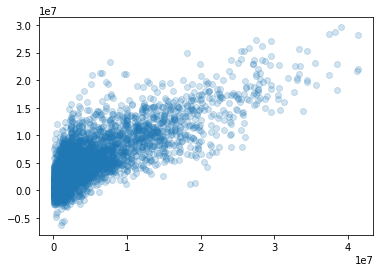

In [73]:
# Fitted vs. Actual on training set
y_train_pred = lr1.predict(X_train)

plt.scatter(y_train, y_train_pred, alpha=0.2,)

In [74]:
def MAE(actuals, preds): #mean absolute error
    return np.mean(np.abs(actuals-preds))

MAE(y_train,y_train_pred)

2982134.2864649384

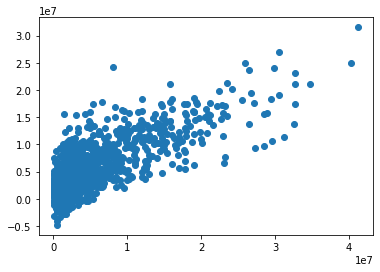

In [75]:
# Fitted vs. Actual
y_val_pred = lr1.predict(X_val)

plt.scatter(y_val, y_val_pred)


Text(0, 0.5, 'Residuals')

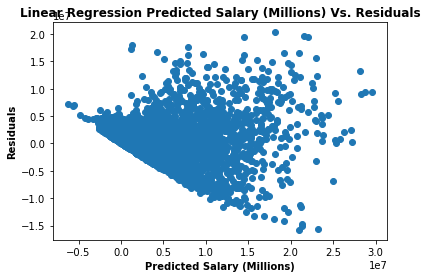

In [76]:
lin_reg_residuals = y_train - y_train_pred

plt.scatter(y_train_pred ,lin_reg_residuals)
plt.title("Residuals vs. Predictions")
plt.title("Linear Regression Predicted Salary (Millions) Vs. Residuals",fontweight='bold')
plt.xlabel("Predicted Salary (Millions)",fontweight='bold')
plt.ylabel("Residuals",fontweight='bold')

Text(0, 0.5, 'Residuals')

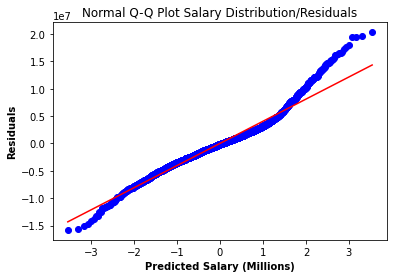

In [77]:
import scipy.stats as stats
stats.probplot(lin_reg_residuals, dist="norm",plot=plt)
plt.title("Normal Q-Q Plot Salary Distribution/Residuals")
plt.xlabel("Predicted Salary (Millions)",fontweight='bold')
plt.ylabel("Residuals",fontweight='bold')

Looking at this Q-Q Plot in combination with the Points scored vs Salary predictions, we definitely ar emissing on the higher end of the distribution by underpredicting star salaries.  For the lowest players in the league we are also actually slightly predicting negative salaries in a few rare cases

## Lasso Model

First we will make sure that we have our scaled features for the lasso model and then we will start with an extremely large alpha to see the most important categories and see how they look compared to the P-Values and Heat maps we looked at earlier

We chose Lasso to evaluate given that Ridge is typically better for a smaller feature set.

In [78]:
#Mean Absolute Error (MAE)
def mae(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true)) 

In [79]:
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [80]:
X_tr_scale = std.transform(X_train.values)
X_val_scale = std.transform(X_val.values)
X_test_scale = std.transform(X_test.values)

(array([168., 322., 412., 495., 478., 371., 414., 451., 313.,  41.]),
 array([-2.04082932, -1.61515028, -1.18947124, -0.7637922 , -0.33811316,
         0.08756588,  0.51324492,  0.93892396,  1.364603  ,  1.79028204,
         2.21596108]),
 <BarContainer object of 10 artists>)

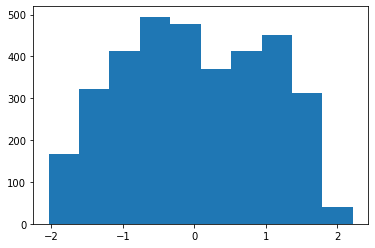

In [81]:
##Looks like most of our features are within 1.5 standard deviations and looks normalish
plt.hist(X_tr_scale[:,3])

In [82]:
lasso_model = Lasso(alpha = 1000000) # Start with really high lambad to get an idea of most important features
lasso_model.fit(X_tr_scale,y_train)

Lasso(alpha=1000000)

Our initial findings with a large alpha are keeping **Age, Defensive Rebounds, Assists, Points** and **Year** as our first and most important features

In [83]:
list(zip(X_train.columns, lasso_model.coef_))

[('Age', 971448.6815214133),
 ('G', -0.0),
 ('GS', 0.0),
 ('MPG', 0.0),
 ('FG', 0.0),
 ('FGA', 0.0),
 ('FGPerc', 0.0),
 ('ThreePoint', 0.0),
 ('ThreePA', 0.0),
 ('ThreePerc', 0.0),
 ('TwoPoint', 0.0),
 ('TwoPA', 0.0),
 ('TwoPerc', 0.0),
 ('eFGPerc', 0.0),
 ('FT', 0.0),
 ('FTA', 0.0),
 ('FTPerc', 0.0),
 ('ORB', 0.0),
 ('DRB', 919206.4773117753),
 ('TRB', 0.0),
 ('AST', 86653.87170679249),
 ('STL', 0.0),
 ('BLK', 0.0),
 ('TOV', 0.0),
 ('PF', 0.0),
 ('PTS', 2425603.860019294),
 ('Tot_Min', 0.0),
 ('PER', 0.0),
 ('TSP', 0.0),
 ('3PAr', -0.0),
 ('FTr', 0.0),
 ('ORBP', 0.0),
 ('DRBP', 0.0),
 ('TRBP', 0.0),
 ('ASTP', 0.0),
 ('STLP', 0.0),
 ('BLKP', 0.0),
 ('TOVP', 0.0),
 ('USGP', 0.0),
 ('OWS', 0.0),
 ('DWS', 0.0),
 ('WS', 0.0),
 ('WS48', 0.0),
 ('OBPM', 0.0),
 ('DBPM', 0.0),
 ('BPM', 0.0),
 ('VORP', 0.0),
 ('ORtg', 0.0),
 ('DRtg', -0.0),
 ('Year', 22239.897639646704),
 ('Intercept', 0.0),
 ('Pos[T.PF]', 0.0),
 ('Pos[T.PG]', -0.0),
 ('Pos[T.SF]', -0.0),
 ('Pos[T.SG]', -0.0)]

Now as we decrease alpha we see a bunch of other categories like **Games, Games Started, Three Point Atempts/%, Free throws/%, Blocks, Personal Fouls, Usage,Year** and **positional categories** to name a few come into solution.  As you recall some of these categories are double dipping from our earlier colinearity features, so we will see if any getting dropped or adjusted in our search for the perfect alpha.

In [84]:
lr_model_lasso = Lasso(alpha = 100000)
lr_model_lasso.fit(X_tr_scale,y_train)

list(zip(X_train.columns, lr_model_lasso.coef_))

[('Age', 1895304.1895336688),
 ('G', -291593.34558197093),
 ('GS', 316134.3452828513),
 ('MPG', -0.0),
 ('FG', 0.0),
 ('FGA', 0.0),
 ('FGPerc', -0.0),
 ('ThreePoint', 0.0),
 ('ThreePA', 227994.324194218),
 ('ThreePerc', -78869.5366070818),
 ('TwoPoint', 0.0),
 ('TwoPA', 0.0),
 ('TwoPerc', -0.0),
 ('eFGPerc', -0.0),
 ('FT', 186463.86523651093),
 ('FTA', 0.0),
 ('FTPerc', -52386.67877690398),
 ('ORB', 0.0),
 ('DRB', 1275563.0593442514),
 ('TRB', 0.0),
 ('AST', 974594.6296238224),
 ('STL', -0.0),
 ('BLK', 331493.74312462023),
 ('TOV', 0.0),
 ('PF', -278046.5740089156),
 ('PTS', 2289929.2546125134),
 ('Tot_Min', -264139.54948349413),
 ('PER', -0.0),
 ('TSP', -130468.61137158527),
 ('3PAr', -26881.78542091449),
 ('FTr', 49962.73538324969),
 ('ORBP', 9768.296634827786),
 ('DRBP', 0.0),
 ('TRBP', 310.0595251144785),
 ('ASTP', -0.0),
 ('STLP', -0.0),
 ('BLKP', 0.0),
 ('TOVP', 95538.2111728427),
 ('USGP', 200725.07878588684),
 ('OWS', 0.0),
 ('DWS', 30300.288528052595),
 ('WS', 0.0),
 ('WS48', 

With an alpha of 10000 we now see that pretty much all categories are in the model with only a few things excluded.  Field Goal Attempts, Three points made, Free Throws Attempted, Offensive rebounds, Offensive win shares, and Small forwards not making the cut in this iteration. Scottie Pippen would be sad to see this.

Below we will use a function to look for the ideal alpha for this model.  First on the training set and then using cross validation

In [85]:
lr_model_lasso2 = Lasso(alpha = 10000)
lr_model_lasso2.fit(X_tr_scale,y_train)

list(zip(X_train.columns, lr_model_lasso2.coef_))

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 287212020627024.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(


[('Age', 1926253.1200297347),
 ('G', 350864.8156429803),
 ('GS', 886528.4055263139),
 ('MPG', -867367.9937521768),
 ('FG', 1708968.4282379055),
 ('FGA', 0.0),
 ('FGPerc', 264258.5511172911),
 ('ThreePoint', 266773.53453349933),
 ('ThreePA', 1031327.7588359035),
 ('ThreePerc', -26637.890994372327),
 ('TwoPoint', 0.0),
 ('TwoPA', -0.0),
 ('TwoPerc', -130999.15380889665),
 ('eFGPerc', 0.0),
 ('FT', 573667.3649175705),
 ('FTA', -0.0),
 ('FTPerc', -95810.22287452768),
 ('ORB', 205895.71373960606),
 ('DRB', 1237431.830217643),
 ('TRB', 371038.8100964082),
 ('AST', 2743052.6176905106),
 ('STL', -94221.2838814011),
 ('BLK', 601904.2104609794),
 ('TOV', -491889.5933701665),
 ('PF', -1075097.4637581154),
 ('PTS', 1432883.979600086),
 ('Tot_Min', -2580980.650554778),
 ('PER', -2033102.8764286477),
 ('TSP', -532107.3554467031),
 ('3PAr', -420234.1114617706),
 ('FTr', 115162.28654213075),
 ('ORBP', 117725.49197672734),
 ('DRBP', -66976.13303861013),
 ('TRBP', -0.0),
 ('ASTP', -866314.372274018),
 (

In [86]:
alphalist = 10**(np.linspace(-4,4,500))
err_vec_val = np.zeros(len(alphalist))
err_vec_train = np.zeros(len(alphalist))

for i,curr_alpha in enumerate(alphalist):

    # note the use of a new sklearn utility: Pipeline to pack
    # multiple modeling steps into one fitting process 
    steps = [('standardize', StandardScaler()), 
             ('lasso', Lasso(alpha = curr_alpha))]

    pipe = Pipeline(steps)
    pipe.fit(X_train.values, y_train)
    
    val_set_pred = pipe.predict(X_val.values)
    err_vec_val[i] = mae(y_val, val_set_pred)

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.95931552377635e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593155140679704e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959315503994513e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/li

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593150561740636e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593150288814972e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959315000562587e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959313741632295e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959313664906363e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959313585295146e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/li

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593100461417172e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593098304468324e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9593096066407356e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9592996572396372e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9592990508702428e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959298421698335e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959270451597089e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959268746951704e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9592669782033376e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/l

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9591883479135068e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959183555779446e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.959178583439019e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/l

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9589575376893656e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9589440661059204e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.958930087938549e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9583086976093316e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9582708277545224e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9582315339235076e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.956484834095111e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.956378388674432e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9562679413243944e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/l

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9516472232948972e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9513589418405624e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9510598230828596e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9377696451275744e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.936960127462127e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9361202236212636e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.8988400876649844e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.896571793740247e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.8942186194782476e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.7900797127909612e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.7837633282754024e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.7772131385478144e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.4896493266391376e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.472348038061334e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.454426444532506e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/l

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.9375648965175572e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.92184992261037e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.906262347321594e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/li

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3913417911284968.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3767796605766752.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3624873350680328.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_mode

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 794327903550472.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 750433132806528.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 710491799839184.0, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_

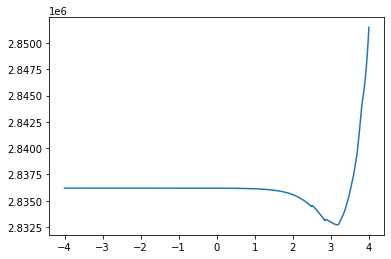

In [87]:
#alpha curve as we change lambda values
plt.plot(np.log10(alphalist), err_vec_val)

In [88]:
#The minimum error we got across our methods was nearly 2.9 million dollars even
#Remember without standard regression what was closer to 3.3 million in our first example
np.min(err_vec_val)

2832701.548222399

In [89]:
#alpha at ~10 appers to be where we get our lowest error
alphalist[np.argmin(err_vec_val)]

1466.6708663439656

In [90]:
lasso_best = Lasso(alpha=.0001)
lasso_best.fit(X, y)

list(zip(X.columns, lasso_best.coef_))

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.8636605846312264e+16, tolerance: 19440898598882.695
  model = cd_fast.enet_coordinate_descent(


[('Age', 437366.4919384681),
 ('G', 18805.482494458764),
 ('GS', 29843.73569975666),
 ('MPG', -129362.37472653946),
 ('FG', 2863326.5370495664),
 ('FGA', 25441.945142740613),
 ('FGPerc', 7238752.20480506),
 ('ThreePoint', 317709.89475277846),
 ('ThreePA', 82580.07242389918),
 ('ThreePerc', -438556.21460166364),
 ('TwoPoint', -32773.405498795),
 ('TwoPA', -812658.9193909661),
 ('TwoPerc', -2566847.630993005),
 ('eFGPerc', 2966311.1484762738),
 ('FT', 2010457.9367954922),
 ('FTA', -760018.3606501044),
 ('FTPerc', -929550.2540144853),
 ('ORB', 661991.5119634824),
 ('DRB', 1361101.1497173004),
 ('TRB', -188953.20972334375),
 ('AST', 2143436.8439831506),
 ('STL', -15583.958722273523),
 ('BLK', 1757446.6076324591),
 ('TOV', -1586721.6476737182),
 ('PF', -1782453.9343081908),
 ('PTS', -37718.03888834289),
 ('Tot_Min', -3373.5208590788343),
 ('PER', -792454.1056678727),
 ('TSP', -21779314.08211517),
 ('3PAr', -2665291.7325246544),
 ('FTr', 568468.0471201133),
 ('ORBP', 171296.97696293492),
 ('

## Finding Ridge, Elastic Net and Lasso best params

We found our Lasso alpha param above on the train and tested it versus the validation set, now we will double check on a cross validation set

In [91]:
## Scale the data as before
kf = KFold(n_splits=5, shuffle=True, random_state = 10)
std = StandardScaler()
std.fit(X_train.values)

StandardScaler()

In [92]:
X_tr = std.transform(X.values)
X_te = std.transform(X_test.values)

In [93]:
alphavec = 10**np.linspace(-4,4,300)

lasso_model = LassoCV(alphas = alphavec, cv=5)
lasso_model.fit(X_tr, y)

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 453635515247984.0, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 342936475005392.0, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 224433149366096.0, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/skle

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6417772500571928e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6474866967748956e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6519509378571456e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/sit

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6066757151016312e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6066963149900324e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.606705826706108e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.606042439422292e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6060423753531904e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6060410434403696e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6059402301202764e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.606124784153932e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6060411172511112e+16, tolerance: 15150747876324.762
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1253185012307496e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1601005108976824e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1959581146749288e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/sit

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6306076184555948e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.630907826306808e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6312316293257748e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.63539345568212e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.635398632391316e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6354031211701668e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-p

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6354687665038408e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6354872053573272e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6354024520849092e+16, tolerance: 15776530658329.072
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/sit

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 484325791296016.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 825946225066048.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1569153453319184.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/skl

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9424323291498784.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9387104582667504.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9352811598684360.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/s

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9874863151567176.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9874520781888536.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9874335878917704.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/s

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9883010954546952.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9883131638434736.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9883081052217488.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/s

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9883353496108624.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9879582609881840.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9884097632344704.0, tolerance: 15659442325111.256
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/s

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2843792246689044e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3101818034610676e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3361956486484644e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/sit

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1764116308456684e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.179539833876392e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.1830478718360756e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2386471649798528e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2387018242759788e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2387600900100684e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/sit

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2392863390840744e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.239288624661866e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.2394081570613768e+16, tolerance: 15685656634507.566
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 483109626074368.0, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 537008429796160.0, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1258194605491832.0, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4255009946498564e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.424705454657094e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4241889349319508e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-pa

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4381002767988568e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4381049193907428e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4381105326773812e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-p

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.4382394011147748e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.438266055465434e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:526: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.438234924043326e+16, tolerance: 15487421029992.46
  model = cd_fast.enet_coordinate_descent_gram(
/opt/anaconda3/envs/metis/lib/python3.8/site-pac

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.3236925065703136e+16, tolerance: 19440898598882.695
  model = cd_fast.enet_coordinate_descent(


LassoCV(alphas=array([1.00000000e-04, 1.06354496e-04, 1.13112788e-04, 1.20300535e-04,
       1.27945027e-04, 1.36075289e-04, 1.44722187e-04, 1.53918552e-04,
       1.63699300e-04, 1.74101565e-04, 1.85164842e-04, 1.96931134e-04,
       2.09445114e-04, 2.22754295e-04, 2.36909207e-04, 2.51963593e-04,
       2.67974609e-04, 2.85003044e-04, 3.03113550e-04, 3.22374888e-04,
       3.42860186e-04, 3.64647222e-0...
       2.42446202e+03, 2.57852435e+03, 2.74237657e+03, 2.91664078e+03,
       3.10197859e+03, 3.29909369e+03, 3.50873446e+03, 3.73169684e+03,
       3.96882735e+03, 4.22102632e+03, 4.48925126e+03, 4.77452054e+03,
       5.07791724e+03, 5.40059328e+03, 5.74377375e+03, 6.10876161e+03,
       6.49694260e+03, 6.90979055e+03, 7.34887289e+03, 7.81585671e+03,
       8.31251499e+03, 8.84073340e+03, 9.40251743e+03, 1.00000000e+04]),
        cv=5)

In [94]:
# selected using simple validation
lasso_model.alpha_

151.56607589006043

The Cross validation alpha for Lasso is fairly different(40 vs 0 basically) then what we saw so we will use aslpha when we use Lasso test on the cross validation

Next let's get ridge and elastic net alpha values

Ridge Model:


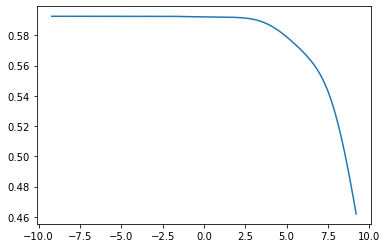

In [95]:
print("Ridge Model:")
params = {
    "alpha": np.logspace(-4, 4, 500)
}

grid_est = GridSearchCV(Ridge(), param_grid=params, cv=kf, 
                        return_train_score=False)
grid_est.fit(X_tr, y)
df = pd.DataFrame(grid_est.cv_results_)
df["alpha"] = df.params.apply(lambda val: val["alpha"])
plt.plot(np.log(df.alpha), df.mean_test_score);

In [96]:
#Ridge best alpha guess
grid_est.best_estimator_

Ridge(alpha=0.039554362447347016)

Elastic Net:


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1437590436366188e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1773917232333708e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.043926631778585e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.077382462067653e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.97455023319799e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1440537813751828e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1779841551334004e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0444764595443468e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.077691514477789e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9752351218478508e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1447803937844116e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1784145355539376e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/skle

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.045280174592448e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0784587598031816e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9757334518229156e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1458316552970556e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1794674140911e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0458628106286492e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0795829398392236e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.976956265066191e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1465862820480124e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.180976697041198e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.047287475369423e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.080400566354693e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.978720589144041e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.148407900343743e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1820547978806892e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0493375752219396e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.082410876237311e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9799899978623388e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1509782117317696e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.184656594238542e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0508122988523132e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0853279664894336e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.983082002658827e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.152794948107944e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1883565460536076e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0544073550997624e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0874359735721504e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9875207452007244e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.157126087675251e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.190997201340468e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.05955825319029e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0925602216318816e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9906928053713516e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.163127421845173e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1973402115670744e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0632163535551224e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0997646352672336e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.998254203409924e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1672750939200452e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.20613326610262e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.071849619828952e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1047653031547924e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0085621828263184e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1768305048987376e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.212197635489783e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0835252952941504e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1162931505180452e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.015565628785135e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1894761255673868e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.226151099991118e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0914516562500684e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1314805284291492e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.031444124827559e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1979512139070236e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2444565167048156e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.109330506614182e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1415289726379856e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.051698212903889e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2167347187069644e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.256464757811014e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1320702978707964e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.163566651474569e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0648848415565476e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.240211664573425e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2825650469946016e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.146474246467291e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1904318378818776e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0926884223479428e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2551867349040824e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/skle

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.3132415761471584e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1765530744084036e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.206373647418791e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.120877989440897e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.282303876011063e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.33015590089908e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.203433835625312e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2357335735692904e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1328598331577516e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2985651798911244e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.3531616904635176e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.214433515752865e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.235253745263915e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1355527124112452e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2989833756243964e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.3241858555395284e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1066720270217576e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2076422435079056e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.7435840058657156e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.966296288803298e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1318753091280756e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklea

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.04085258778196e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.042367134715973e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6785805608212948e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6761373361589168.0, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9280262873130728.0, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5071240382390000.0, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_mo

/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1093434978776792.0, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 47371123734888.0, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 70472468113880.0, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model

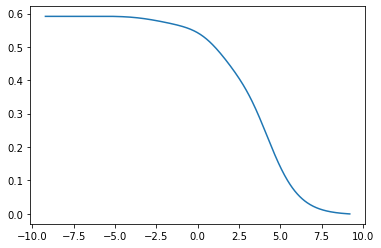

In [97]:
print("Elastic Net:")
params = {
    "alpha": np.logspace(-4, 4, 500)
}

grid_est = GridSearchCV(ElasticNet(), param_grid=params, cv=kf, 
                        return_train_score=False)
grid_est.fit(X_tr, y)
df = pd.DataFrame(grid_est.cv_results_)
df["alpha"] = df.params.apply(lambda val: val["alpha"])
plt.plot(np.log(df.alpha), df.mean_test_score);

In [98]:
grid_est.best_estimator_

ElasticNet(alpha=0.001780332016430114)

### Linear Regression, Ridge, Lasso, Poly, Elastic Net Comparison and Utilizing KFold

Now lets perform the analysis this time with the training on validation and compare those vs our cross validation sets. For cross validation we will use the alphas above. 

For the test on validation, we have the lastt number.  For Ridge and Elastic Net we will default to the number we got in cross validation

In [99]:
from sklearn.preprocessing import PolynomialFeatures
lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
std = StandardScaler()

X_train_scaled = std.fit_transform(X_train.values)
X_val_scaled = std.transform(X_val.values)
#X_test_scaled = std.transform(X_test.values)

lm_reg = Ridge(alpha=0.09953962309984234)
lm_elast = ElasticNet(alpha=0.0022217407810628826)
#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) #Using 2 generically

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
#X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()


lm_lasso = Lasso(alpha = .0001) #from the train vs validation

In [100]:
lm.fit(X_train, y_train)
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.5f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.5f}')

lm_lasso.fit(X_train_scaled, y_train)
print(f'Lasso Regression val R^2: {lm_lasso.score(X_val_scaled, y_val):.5f}')

lm_elast.fit(X_train_scaled, y_train)
print(f'Elastic Net Regression val R^2: {lm_elast.score(X_val_scaled, y_val):.5f}')

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

Linear Regression val R^2: 0.59172
Ridge Regression val R^2: 0.59177
Lasso Regression val R^2: 0.59156


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.95931552377635e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.9790824258804468e+16, tolerance: 14931766908711.93
  model = cd_fast.enet_coordinate_descent(


Elastic Net Regression val R^2: 0.59126
Degree 2 polynomial regression val R^2: 0.216


After the first set of testing and scoring each of linear regression, ridge,Elastic Net and Lasso and Poly, we see that the poly candidate is not performing well. The other four are scoring similarly on the validation data.  Let's take a look at how KFold can improve this through cross validation

In [101]:
#update Lasso to cross validation alpha
lm_lasso = Lasso(alpha = .0001) #from the train vs validation

In [102]:
#Setting up code to run cross validation on linear regression, ridge and lasso
lm = LinearRegression()
kf = KFold(n_splits=5, shuffle=True, random_state = 10)
cross_val_score(lm, X, y, # estimator, features, target
                cv=kf, # number of folds 
                scoring='r2') # scoring metric


array([0.59310437, 0.60903361, 0.56988632, 0.61587202, 0.57518512])

In [103]:
print(f"Linear Regression 5-Fold Cross Val Score : {np.mean(cross_val_score(lm, X, y, cv=kf, scoring='r2')):.4f}")
print(f"Ridge 5-Fold Cross Val Score : {np.mean(cross_val_score(lm_reg, X, y, cv = kf, scoring = 'r2')):.4f}")
print(f"Lasso 5-fold Cross Val Score: {np.mean(cross_val_score(lm_lasso, X, y, cv = kf, scoring = 'r2')):.4f}")
print(f"Elastic Net 5-fold Cross Val Score: {np.mean(cross_val_score(lm_elast, X, y, cv = kf, scoring = 'r2')):.4f}")

Linear Regression 5-Fold Cross Val Score : 0.5926
Ridge 5-Fold Cross Val Score : 0.5929


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1425274042999796e+16, tolerance: 15841404013839.924
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.176156941119561e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0427876684412924e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklear

Lasso 5-fold Cross Val Score: 0.5915


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.1970229111652784e+16, tolerance: 15853954842891.688
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0582906399263224e+16, tolerance: 15589153905315.94
  model = cd_fast.enet_coordinate_descent(


Elastic Net 5-fold Cross Val Score: 0.5912


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0999483165389364e+16, tolerance: 15286669183707.768
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.993805918659426e+16, tolerance: 15180907590732.451
  model = cd_fast.enet_coordinate_descent(


Looking at the first results, it appears with generics alphas of 1 in Ridge and Lasso respectively we don't see a winner vs generic linear regression.  All three of these options are better than polynomal however, which scored poorly.

For KFold we saw all three philosophies perform better than our basic train val split, but Lasso just barely as the best performer, getting the largest boost and coming in with the top overall score.

## Ridge CV MODEL WINS... Time to test it

In [136]:
std = StandardScaler()

In [137]:
X_std = std.fit_transform(X.values)# 80%
X_te = std.transform(X_test.values) #Test Data

In [138]:
lm_ridge_final= Ridge(alpha=0.09953962309984234)
lm_ridge_final.fit(X_std, y)

Ridge(alpha=0.09953962309984234)

In [139]:
# Make predictions on the test set using the new model
test_set_pred = lm_ridge_final.predict(X_te)

In [140]:
mae(y_test, test_set_pred)

2883507.9721952495

In [141]:
r2_score(y_test, test_set_pred)

0.5947212650623273

In [142]:
list(zip(X.columns, lm_ridge_final.coef_))

[('Age', 1859937.605479129),
 ('G', 452617.4349178635),
 ('GS', 837317.6469100941),
 ('MPG', -1081206.797829563),
 ('FG', 630071.6897605632),
 ('FGA', 14244840.894614672),
 ('FGPerc', 673377.4921297723),
 ('ThreePoint', -426228.00335760246),
 ('ThreePA', -6047944.168429172),
 ('ThreePerc', -72543.86705153108),
 ('TwoPoint', 608159.7890263675),
 ('TwoPA', -14620838.4412333),
 ('TwoPerc', -240921.9203293026),
 ('eFGPerc', 119683.43846340975),
 ('FT', 1273605.1373476293),
 ('FTA', -1408978.4684309077),
 ('FTPerc', -166801.34484929082),
 ('ORB', 394408.7420256936),
 ('DRB', 2242911.496562865),
 ('TRB', -153225.22211070685),
 ('AST', 3805382.9638660843),
 ('STL', -13450.152615708128),
 ('BLK', 777091.1178851334),
 ('TOV', -1239607.996470015),
 ('PF', -1319616.0221998293),
 ('PTS', 6713270.306109509),
 ('Tot_Min', -2806963.027263059),
 ('PER', -4146937.584205228),
 ('TSP', -1544386.5909875857),
 ('3PAr', -535852.1585997991),
 ('FTr', 110408.1119126321),
 ('ORBP', 1552320.249082504),
 ('DRBP'

In [149]:
ridge_feat_dict = dict(zip(X.columns, lm_ridge_final.coef_))
ridge_feat_table = pd.DataFrame.from_dict(ridge_feat_dict, orient='index')
ridge_feat_table.sort_values(by = 0, ascending=False,inplace=True)
ridge_feat_table.rename(columns={0: "Feature Importance"},inplace=True)
ridge_feat_table

,Feature Importance
FGA,1.424484e+07
WS,7.410024e+06
PTS,6.713270e+06
BPM,4.321359e+06
AST,3.805383e+06
USGP,2.276018e+06
DRB,2.242911e+06
DRBP,2.075179e+06
Age,1.859938e+06
ORBP,1.552320e+06


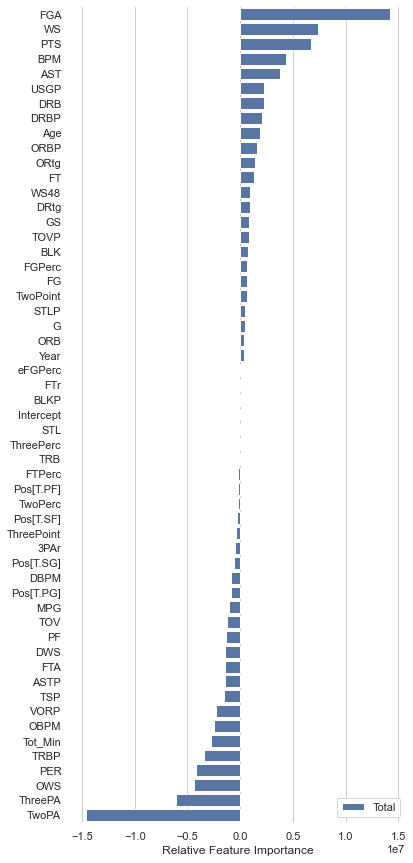

In [151]:
sns.set_theme(style="whitegrid")


f, ax = plt.subplots(figsize=(6, 15))

# Load the example car crash dataset
crashes = sns.load_dataset("car_crashes").sort_values("total", ascending=False)

# Plot the total crashes

sns.barplot(x=ridge_feat_table['Feature Importance'], y=ridge_feat_table.index, 
            label="Total", color="b")


# Add a legend and informative axis label
ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(
       xlabel="Relative Feature Importance")
sns.despine(left=True, bottom=True)

Text(0, 0.5, 'Residuals')

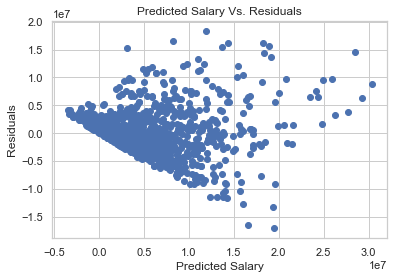

In [113]:
ridge_residual = (y_test) - (test_set_pred)
plt.scatter((test_set_pred), ridge_residual)
plt.title("Predicted Salary Vs. Residuals")
plt.xlabel("Predicted Salary")
plt.ylabel("Residuals")

Text(0, 0.5, 'Residuals')

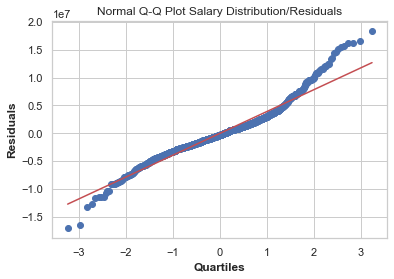

In [114]:
import scipy.stats as stats
stats.probplot(ridge_residual, dist="norm",plot=plt)
plt.title("Normal Q-Q Plot Salary Distribution/Residuals")
plt.xlabel("Quartiles",fontweight='bold')
plt.ylabel("Residuals",fontweight='bold')

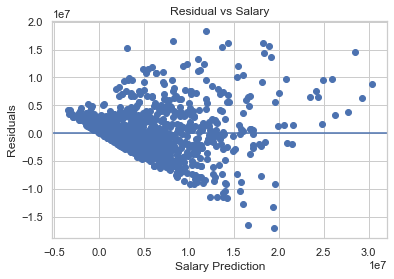

In [115]:
ridge_residual = (y_test) - (test_set_pred)
plt.scatter((test_set_pred), ridge_residual)
plt.title("Residual vs Salary")
plt.xlabel("Salary Prediction")
plt.ylabel("Residuals")
plt.axhline(0)
plt.savefig('Residual.png')

### Khwai Leonard Salary Prediciton

In [116]:
ballers[ballers['Player']=='Kawhi Leonard']

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,DWS,WS,WS48,OBPM,DBPM,BPM,VORP,ORtg,DRtg,Year
1611,Kawhi Leonard,SF,20,SAS,64,39,24.0,3.1,6.3,0.493,...,2.4,5.5,0.171,1.6,1.8,3.4,2.1,119.0,101.0,2012
2073,Kawhi Leonard,SF,21,SAS,58,57,31.2,4.5,9.1,0.494,...,3.3,6.2,0.166,1.1,2.0,3.1,2.3,114.0,99.0,2013
2551,Kawhi Leonard,SF,22,SAS,66,65,29.1,5.1,9.8,0.522,...,3.9,7.7,0.193,2.1,3.0,5.1,3.5,116.0,98.0,2014
3044,Kawhi Leonard,SF,23,SAS,64,64,31.8,6.2,12.8,0.479,...,4.4,8.6,0.204,2.8,3.1,5.9,4.1,113.0,96.0,2015
3519,Kawhi Leonard,SF,24,SAS,72,72,33.1,7.7,15.1,0.506,...,5.5,13.7,0.277,6.1,3.0,9.1,6.7,121.0,96.0,2016
3993,Kawhi Leonard,SF,25,SAS,74,74,33.4,8.6,17.7,0.485,...,4.7,13.6,0.264,7.1,2.2,9.4,7.1,121.0,102.0,2017
4511,Kawhi Leonard,SF,26,SAS,9,9,23.3,5.8,12.3,0.468,...,0.5,0.9,0.196,5.2,4.9,10.1,0.6,109.0,97.0,2018
5059,Kawhi Leonard,SF,27,TOR,60,60,34.0,9.3,18.8,0.496,...,3.4,9.5,0.224,6.1,1.1,7.2,4.7,119.0,105.0,2019
5582,Kawhi Leonard,SF,28,LAC,57,57,32.4,9.3,19.9,0.470,...,3.3,8.7,0.226,6.5,2.4,8.9,5.1,117.0,104.0,2020
6100,Kawhi Leonard,SF,29,LAC,45,45,34.6,9.4,18.3,0.515,...,2.1,8.0,0.246,5.8,1.0,6.8,3.5,126.0,110.0,2021


In [117]:
kawhi = X_test[(X_test['G']==45)&(X_test['GS']==45)&(X_test['PTS']==26.0)]
kawhi_std = std.transform(kawhi)

In [118]:
y_pred = lm_ridge_final.predict(kawhi_std)
y_pred

array([24870110.10387592])

Our Model says that Kawhi Leonard should be getting about 25 million this off season give or take 3 million in either direction, so 28 million at the top end of the range.  This is still well below his 34 million a year he makes and the 36 he has an option to make next year.

It also comes back to the models behavior to miss on higher level players, let's zoom in on the other top free agents, most of which aren't super stars to see if predictions are closer to what their current value is

### Other top Free Agents Preductions

##### John Collins (C)

A young 23 year old center for the Atlanta Hawks. Current estimates are looking like 70million over 4 years which would put expected salary to be near 17-18 million, our model is preding around 12.8 million for John Collins based on 2021

In [119]:
jcollins = X_test[(X_test['G']==47)&(X_test['MPG']==30.3)&(X_test['DRtg']==112.0)]
jcollins_std = std.transform(jcollins)
y_pred = lm_ridge_final.predict(jcollins_std)
y_pred

array([12788169.63550204])

#### Mike Conley (PG)

A veteran point guard making the same salary as Kawhi Leonard currently, but at 33 years old.  He is on the team with the best record in the league but our predictor says he's only worth about 19 million dollars.

In [120]:
conley = X_test[(X_test['WS48']==.195)&(X_test['MPG']==29.8)&(X_test['DRtg']==110.0)]
conley_std = std.transform(conley)
y_pred = lm_ridge_final.predict(conley_std)
y_pred

array([18920543.97543527])

#### Victor Oladipo  (SG)

Currently making 21 million so our target prediction was pretty close.  In the prime of his career but has injury history.  Our model looked to be better on middle tier players and this helps.  hough if we think our model is undepredicting this might mean that Oladipo is a bargin right now

In [121]:
oladipo =  X[( X['WS48']==.024)&( X['MPG']==32.7)&( X['FGPerc']==.408)]
oladipo_std = std.transform(oladipo)
y_pred = lm_ridge_final.predict(oladipo_std)
y_pred

array([19370261.22559329])

#### Lonzo Ball (PG)

Currently only 23 years old and making 11 million, our stats have him warranting a salary of nearly 14 million so so another player who should be making more than that are currently today

In [122]:
lonzo = X_test[( X_test['WS48']==.096)&( X_test['MPG']==31.7)&( X_test['FGPerc']==.424)]
lonzo_std = std.transform(lonzo)
y_pred = lm_ridge_final.predict(lonzo_std)
y_pred

array([13839108.2767905])

#### Serge Ibaka (PF)

A 31 year old Power Forward currently only making 9 million a year, his stats are saying he should be closer to 14 million.  While he is older, he is a former NBA champion and doesn't have extensive injury history

In [123]:
serge =X_test[( X_test['WS48']==.141)&( X_test['MPG']==23.6)&( X_test['FGPerc']==.507)]
serge_std = std.transform(serge)
y_pred = lm_ridge_final.predict(serge_std)
y_pred

array([14064419.35441693])

#### DeMar DeRozan

In [124]:
demar= X[( X['WS48']==.181)&( X['MPG']==33.9)&( X['FGPerc']==.497)]
demar_std = std.transform(demar)
y_pred = lm_ridge_final.predict(demar_std)
y_pred

array([22773326.00867862])

## Random Forest

In [125]:
rf = RandomForestRegressor(n_estimators=1800, max_features=20)
rf.fit(X, y)
rf.score(X_test, y_test)

0.6680388270709866

In [126]:
y_pred = rf.predict(X_test)

In [127]:
MAE(y_test,y_pred)

2411625.6781904395

<ipython-input-128-b78736bd19a1>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sigfeatures_final1.sort_values(by = 'Significance',inplace= True, ascending =False)


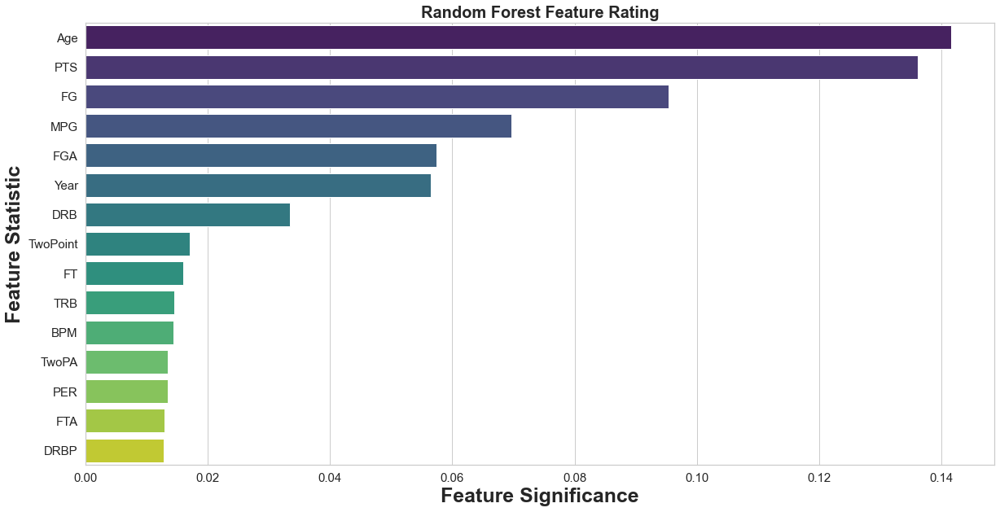

In [128]:
sigfeatures = list(zip(X_train.columns,rf.feature_importances_))
sigfeatures= sorted(sigfeatures, key = lambda x: x[1], reverse=False)
sigfeatures = pd.DataFrame(sigfeatures, columns=['Feature','Significance'])
sigfeatures_final =  sigfeatures.sort_values('Significance',ascending = False)
sigfeatures_final1 = sigfeatures_final.head(15)
sigfeatures_final1.sort_values(by = 'Significance',inplace= True, ascending =False)


g=sns.barplot(x="Significance", y="Feature", data=sigfeatures_final1,palette ="viridis")
g.set_xlabel('Feature Significance',fontsize=25, fontweight='bold')
g.set_ylabel('Feature Statistic',fontsize=25, fontweight='bold')
g.xaxis.set_tick_params(labelsize=15)
g.yaxis.set_tick_params(labelsize=15)
#g.set_ylabel(l, fontsize=10)
g.set_title('Random Forest Feature Rating',fontsize=20, fontweight='bold')
plt.gcf().set_size_inches(20, 10)

In [129]:
#Get an idea of the feature significance for the whole land scape
sigfeatures_final

,Feature,Significance
54,Age,0.141622
53,PTS,0.136215
52,FG,0.095439
51,MPG,0.069612
50,FGA,0.057360
49,Year,0.056451
48,DRB,0.033457
47,TwoPoint,0.017037
46,FT,0.015935
45,TRB,0.014487


## Gradient Boosting

In [130]:
gbm = GradientBoostingRegressor(n_estimators=1600, max_depth=3, learning_rate=.01)
gbm.fit(X, y)
gbm.score(X_test, y_test)

0.6763012075051809

In [131]:
y_pred = gbm.predict(X_test)

In [132]:
MAE(y_test,y_pred)

2392528.5942369257

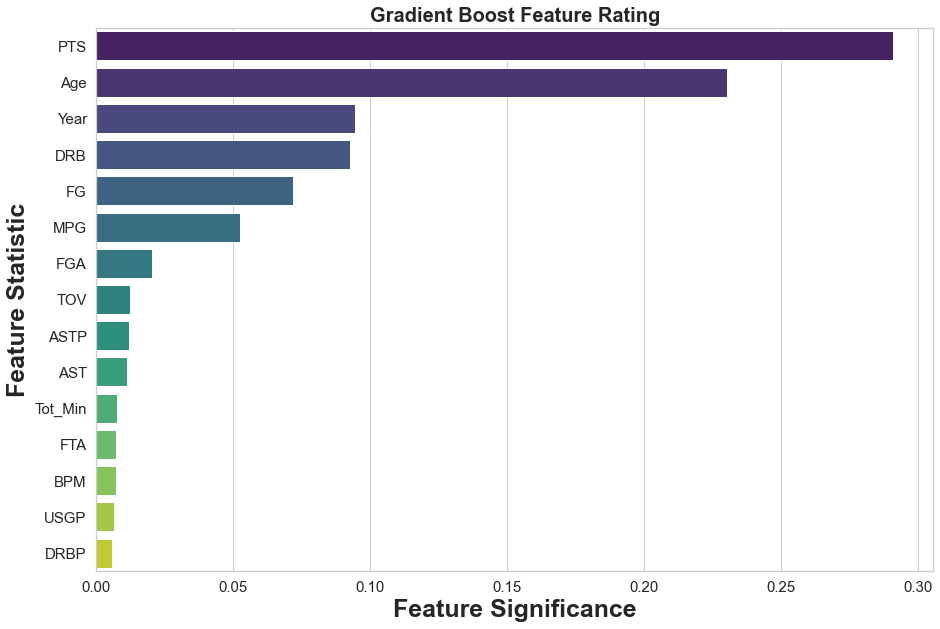

In [133]:
sigfeatures = list(zip(X_train.columns,gbm.feature_importances_))
sigfeatures= sorted(sigfeatures, key = lambda x: x[1], reverse=False)
sigfeatures = pd.DataFrame(sigfeatures, columns=['Feature','Significance'])
sigfeatures_final =  sigfeatures.sort_values('Significance',ascending = False)
sigfeatures_final = sigfeatures_final.head(15)
sigfeatures_final.sort_values(by = 'Significance',inplace= True, ascending =False)


g=sns.barplot(x="Significance", y="Feature", data=sigfeatures_final,palette ="viridis")
g.set_xlabel('Feature Significance',fontsize=25, fontweight='bold')
g.set_ylabel('Feature Statistic',fontsize=25, fontweight='bold')
g.xaxis.set_tick_params(labelsize=15)
g.yaxis.set_tick_params(labelsize=15)
g.set_title('Gradient Boost Feature Rating',fontsize=20, fontweight='bold')
plt.gcf().set_size_inches(15, 10)

## Square Root Salary Modeling Area


In [152]:
#Square Root  Salary added for this analysis
ballers_model_sq = ballers_model.copy()
ballers_model_sq['SqRtSal'] = np.sqrt(ballers_model_sq.Salary)
ballers_model_sq

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,ORtg,DRtg,Year,Salary,Intercept,Pos[T.PF],Pos[T.PG],Pos[T.SF],Pos[T.SG],SqRtSal
0,Alex Acker,SG,26,TOT,25,0,8.0,1.2,3.0,0.395,...,94.0,114.0,2009,711517.0,1.0,0.0,0.0,0.0,1.0,843.514671
1,Hassan Adams,SG,24,TOR,12,0,4.3,0.3,1.1,0.308,...,63.0,111.0,2009,297163.0,1.0,0.0,0.0,0.0,1.0,545.126591
2,Arron Afflalo,SG,23,DET,74,8,16.7,1.8,4.1,0.437,...,107.0,110.0,2009,1015440.0,1.0,0.0,0.0,0.0,1.0,1007.690429
3,Maurice Ager,SG,24,NJN,20,0,4.9,0.8,2.2,0.349,...,77.0,115.0,2009,1042440.0,1.0,0.0,0.0,0.0,1.0,1020.999510
5,Alexis Ajinca,PF,20,CHA,31,4,5.9,0.8,2.2,0.362,...,86.0,104.0,2009,1276320.0,1.0,1.0,0.0,0.0,0.0,1129.743334
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6024,Delon Wright,SG,28,TOT,46,31,27.1,3.5,7.6,0.453,...,118.0,112.0,2021,9000000.0,1.0,0.0,0.0,0.0,1.0,3000.000000
6025,Thaddeus Young,PF,32,CHI,50,17,24.7,5.5,9.5,0.581,...,118.0,110.0,2021,13545000.0,1.0,1.0,0.0,0.0,0.0,3680.353244
6026,Trae Young,PG,22,ATL,50,50,34.3,7.8,17.8,0.435,...,116.0,116.0,2021,6571800.0,1.0,0.0,1.0,0.0,0.0,2563.552223
6027,Cody Zeller,C,28,CHO,35,20,21.4,3.7,6.8,0.540,...,123.0,111.0,2021,15415730.0,1.0,0.0,0.0,0.0,0.0,3926.287050


In [153]:
#Split data into 80% Train and Validation Set and the Remaining as 20% for the Test Set
X, y = ballers_model_sq.drop(['Salary','SqRtSal'],axis=1), ballers_model_sq['SqRtSal']

# hold out 20% of the data for final testing
X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=10)

#Strip out player name, team and POS as we've replaced those with dummies
X = X[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]

X_test = X_test[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]

In [154]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=10)

In [155]:
# Create an empty model to run and fit on our training data
lr1 = LinearRegression()

# Fit the model to the training data set
lr1.fit(X_train, y_train)

# Print out the R^2 for the model against the validation set
lr1.score(X_val,y_val)

0.6155117656779902

In [156]:
#How does this compare when running on our training set
lr1.score(X_train,y_train)

0.6268895109410182

In [157]:
lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
std = StandardScaler()

X_train_scaled = std.fit_transform(X_train.values)
X_val_scaled = std.transform(X_val.values)
#X_test_scaled = std.transform(X_test.values)

lm_reg = Ridge(alpha=0.04418659956385941)
lm_elast = ElasticNet(alpha=0.0012770633013086446)
#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) #Using 2 generically

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
#X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()


lm_lasso = Lasso(alpha = .0001) #from the train vs validation

In [158]:
lm.fit(X_train, y_train)
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.5f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.5f}')

lm_lasso.fit(X_train_scaled, y_train)
print(f'Lasso Regression val R^2: {lm_lasso.score(X_val_scaled, y_val):.5f}')

lm_elast.fit(X_train_scaled, y_train)
print(f'Elastic Net Regression val R^2: {lm_elast.score(X_val_scaled, y_val):.5f}')

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

Linear Regression val R^2: 0.61551
Ridge Regression val R^2: 0.61561
Lasso Regression val R^2: 0.61568


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 956515993.3307781, tolerance: 511131.37729684403
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 956438704.6951419, tolerance: 511131.37729684403
  model = cd_fast.enet_coordinate_descent(


Elastic Net Regression val R^2: 0.61598
Degree 2 polynomial regression val R^2: 0.131


In [159]:
#update Lasso to cross validation alpha
lm_lasso = Lasso(alpha = .25) #from the train vs validation

In [160]:
#Setting up code to run cross validation on linear regression, ridge and lasso
lm = LinearRegression()
kf = KFold(n_splits=5, shuffle=True, random_state = 10)
cross_val_score(lm, X, y, # estimator, features, target
                cv=kf, # number of folds 
                scoring='r2') # scoring metric

array([0.62248607, 0.62394643, 0.59590847, 0.64193197, 0.59613914])

In [161]:
print(f"Linear Regression 5-Fold Cross Val Score : {np.mean(cross_val_score(lm, X, y, cv=kf, scoring='r2')):.4f}")
print(f"Ridge 5-Fold Cross Val Score : {np.mean(cross_val_score(lm_reg, X, y, cv = kf, scoring = 'r2')):.4f}")
print(f"Lasso 5-fold Cross Val Score: {np.mean(cross_val_score(lm_lasso, X, y, cv = kf, scoring = 'r2')):.4f}")
print(f"Elastic Net 5-fold Cross Val Score: {np.mean(cross_val_score(lm_elast, X, y, cv = kf, scoring = 'r2')):.4f}")

Linear Regression 5-Fold Cross Val Score : 0.6161
Ridge 5-Fold Cross Val Score : 0.6162


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 969355934.8317609, tolerance: 543542.5295959302
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 656688248.5200174, tolerance: 543871.6077621505
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 966188991.002593, tolerance: 536800.3941102623
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_c

Lasso 5-fold Cross Val Score: 0.6143


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1031250562.176022, tolerance: 543871.6077621505
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 994128839.8321619, tolerance: 536800.3941102623
  model = cd_fast.enet_coordinate_descent(


Elastic Net 5-fold Cross Val Score: 0.6136


/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1017794369.6609484, tolerance: 531429.6206136297
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/envs/metis/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 987359929.0358561, tolerance: 530758.3479769487
  model = cd_fast.enet_coordinate_descent(


Ridge Model:


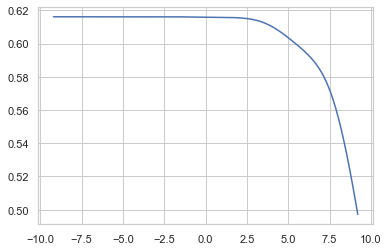

In [162]:
print("Ridge Model:")
params = {
    "alpha": np.logspace(-4, 4, 500)
}

grid_est = GridSearchCV(Ridge(), param_grid=params, cv=kf, 
                        return_train_score=False)
grid_est.fit(X_tr, y)
df = pd.DataFrame(grid_est.cv_results_)
df["alpha"] = df.params.apply(lambda val: val["alpha"])
plt.plot(np.log(df.alpha), df.mean_test_score);

In [163]:
#Ridge best alpha guess
grid_est.best_estimator_

Ridge(alpha=0.04418659956385941)

In [164]:
std = StandardScaler()

In [165]:
X_std = std.fit_transform(X.values)# 80%
X_te = std.transform(X_test.values) #Test Data

In [166]:
lm_ridge_final= Ridge(alpha=0.04418659956385941)
lm_ridge_final.fit(X_std, y)

Ridge(alpha=0.04418659956385941)

In [167]:
# Make predictions on the test set using the new model
test_set_pred = lm_ridge_final.predict(X_te)

In [168]:
mae(y_test, test_set_pred)

563.7444976676587

In [169]:
r2_score(y_test, test_set_pred)

0.6120845617982715

## Log Salary Modeling Area

In [170]:
#Adding Log to data frame for analysis
ballers_model_log = ballers_model.copy()
ballers_model_log['LogSal'] = np.log(ballers_model_sq.Salary)
ballers_model_log

,Player,Pos,Age,Tm,G,GS,MPG,FG,FGA,FGPerc,...,ORtg,DRtg,Year,Salary,Intercept,Pos[T.PF],Pos[T.PG],Pos[T.SF],Pos[T.SG],LogSal
0,Alex Acker,SG,26,TOT,25,0,8.0,1.2,3.0,0.395,...,94.0,114.0,2009,711517.0,1.0,0.0,0.0,0.0,1.0,13.475155
1,Hassan Adams,SG,24,TOR,12,0,4.3,0.3,1.1,0.308,...,63.0,111.0,2009,297163.0,1.0,0.0,0.0,0.0,1.0,12.602036
2,Arron Afflalo,SG,23,DET,74,8,16.7,1.8,4.1,0.437,...,107.0,110.0,2009,1015440.0,1.0,0.0,0.0,0.0,1.0,13.830833
3,Maurice Ager,SG,24,NJN,20,0,4.9,0.8,2.2,0.349,...,77.0,115.0,2009,1042440.0,1.0,0.0,0.0,0.0,1.0,13.857075
5,Alexis Ajinca,PF,20,CHA,31,4,5.9,0.8,2.2,0.362,...,86.0,104.0,2009,1276320.0,1.0,1.0,0.0,0.0,0.0,14.059491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6024,Delon Wright,SG,28,TOT,46,31,27.1,3.5,7.6,0.453,...,118.0,112.0,2021,9000000.0,1.0,0.0,0.0,0.0,1.0,16.012735
6025,Thaddeus Young,PF,32,CHI,50,17,24.7,5.5,9.5,0.581,...,118.0,110.0,2021,13545000.0,1.0,1.0,0.0,0.0,0.0,16.421528
6026,Trae Young,PG,22,ATL,50,50,34.3,7.8,17.8,0.435,...,116.0,116.0,2021,6571800.0,1.0,0.0,1.0,0.0,0.0,15.698298
6027,Cody Zeller,C,28,CHO,35,20,21.4,3.7,6.8,0.540,...,123.0,111.0,2021,15415730.0,1.0,0.0,0.0,0.0,0.0,16.550899


In [171]:
#Split data into 80% Train and Validation Set and the Remaining as 20% for the Test Set
X, y = ballers_model_log.drop(['Salary','LogSal'],axis=1), ballers_model_log['LogSal']

# hold out 20% of the data for final testing
X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=10)

#Strip out player name, team and POS as we've replaced those with dummies
X = X[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]

X_test = X_test[['Age', 'G', 'GS', 'MPG', 'FG', 'FGA', 'FGPerc',
       'ThreePoint', 'ThreePA', 'ThreePerc', 'TwoPoint', 'TwoPA', 'TwoPerc',
       'eFGPerc', 'FT', 'FTA', 'FTPerc', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'Tot_Min', 'PER', 'TSP', '3PAr', 'FTr',
       'ORBP', 'DRBP', 'TRBP', 'ASTP', 'STLP', 'BLKP', 'TOVP', 'USGP', 'OWS',
       'DWS', 'WS', 'WS48', 'OBPM', 'DBPM', 'BPM', 'VORP', 'ORtg', 'DRtg',
       'Year',  'Intercept', 'Pos[T.PF]', 'Pos[T.PG]', 'Pos[T.SF]',
       'Pos[T.SG]']]

In [172]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=10)

In [173]:
# Create an empty model to run and fit on our training data
lr1 = LinearRegression()

# Fit the model to the training data set
lr1.fit(X_train, y_train)

# Print out the R^2 for the model against the validation set
lr1.score(X_val,y_val)

0.5607187000586138

In [174]:
lr1.score(X_train,y_train)

0.5781764943713907

Stopped here on log as it appears to not be a better model thus far then regular or square root salary